# Initialisation

In [2]:
# basis
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# data
from google.colab import drive
drive.mount('/content/drive')

# timing managment
from tqdm import tqdm
from time import time

# Clustering
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer, InterclusterDistance
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# Transformation
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# extraction de données
#	prétraitement
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer, WordNetLemmatizer
import string
#	bag-of-word
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from collections import Counter
#	word2vec
from gensim.models import Word2Vec
#	BERT
from transformers import BertTokenizer, BertModel
import torch
#	USE
import tensorflow_hub as hub
import tensorflow as tf

# visualisation
from sklearn.manifold import TSNE
from matplotlib.backends.backend_agg import FigureCanvasAgg
import io
import matplotlib.image as mpimg

Mounted at /content/drive


In [3]:
path_data = '/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 6/data/Flipkart/'
path_image = path_data+'Images/'

data_source = pd.read_csv(path_data + 'flipkart_com-ecommerce_sample_1050.csv')

In [4]:
data_source.head(2)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [5]:
data_source.product_specifications[0]

'{"product_specification"=>[{"key"=>"Brand", "value"=>"Elegance"}, {"key"=>"Designed For", "value"=>"Door"}, {"key"=>"Type", "value"=>"Eyelet"}, {"key"=>"Model Name", "value"=>"Abstract Polyester Door Curtain Set Of 2"}, {"key"=>"Model ID", "value"=>"Duster25"}, {"key"=>"Color", "value"=>"Multicolor"}, {"key"=>"Length", "value"=>"213 cm"}, {"key"=>"Number of Contents in Sales Package", "value"=>"Pack of 2"}, {"key"=>"Sales Package", "value"=>"2 Curtains"}, {"key"=>"Material", "value"=>"Polyester"}]}'

In [6]:
data_source.description[0]

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

In [7]:
data_source['product_category_tree'][0]

'["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]'

## Préparation des catégories

In [8]:
# We build category list with only top of the category tree
X = np.array(data_source['product_category_tree'])

# only keep the first category in each X elt
X_cat = [] # initialized category list
for i in range(len(X)):

  s = X[i]
  a, b = s.find('"') + 1, s.find(' >> ')
  cat = s[a : b]

  X_cat.append(cat)

In [9]:
# select image names and descriptions which are the only relevant features for preprocess and classification
data = data_source[['image', 'description']].copy()

# add path
data['image_path'] = [path_image+data['image'][i] for i in range(data.shape[0])]
data = data.drop('image', axis = 1)

# add category
data['category'] = X_cat

In [10]:
data['category'].value_counts()

Home Furnishing               150
Baby Care                     150
Watches                       150
Home Decor & Festive Needs    150
Kitchen & Dining              150
Beauty and Personal Care      150
Computers                     150
Name: category, dtype: int64

In [11]:
data

,description,image_path,category
0,Key Features of Elegance Polyester Multicolor ...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Home Furnishing
1,Specifications of Sathiyas Cotton Bath Towel (...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Baby Care
2,Key Features of Eurospa Cotton Terry Face Towe...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Baby Care
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Home Furnishing
4,Key Features of Jaipur Print Cotton Floral Kin...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Home Furnishing
...,...,...,...
1045,Oren Empower Extra Large Self Adhesive Sticker...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Baby Care
1046,Wallmantra Large Vinyl Sticker Sticker (Pack o...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Baby Care
1047,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Baby Care
1048,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Baby Care


# Extraction de features texte

## Pré-traitements

### 1) fonctions de prétraitement

In [16]:
# Télécharger les ressources nécessaires pour NLTK
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [17]:
# création d'ensembles pour suppression de la ponctuation et des mots de liaison
stop_words = set(stopwords.words('english'))  # Mots de liaison en français
punctuation = set(string.punctuation)

In [18]:
len(list(stop_words)), len(list(punctuation))

(179, 32)

In [19]:
# texte à prétraiter
text = data.description[0]

# Tokenization
tokens = word_tokenize(text)

# Suppression de la ponctuation et des mots de liaison, mise en minuscules
filtered_tokens = [word.lower() for word in tokens if word.lower() not in stop_words and word.lower() not in punctuation]

# résultat cleané
text_cleaned = ' '.join(filtered_tokens)

print("texte d'origine :")
print(text)
print("\ntexte pré-traité :")
print(text_cleaned)

texte d'origine :
Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your

In [20]:
def tokeniser_fct(str_to_token): # data_source.description[0]

  # texte à prétraiter
  text = str_to_token

  # Tokenization
  tokens = word_tokenize(text)

  # Suppression de la ponctuation et des mots de liaison, mise en minuscules
  filtered_tokens = [word.lower() for word in tokens if word.lower() not in stop_words and word.lower() not in punctuation]

  # résultat cleané
  text_cleaned = ' '.join(filtered_tokens)

  return (filtered_tokens, text_cleaned)

In [21]:
# fonction de stemming
def stemmer_fct(str_to_token):

  filtered_tokens = tokeniser_fct(str_to_token)[0]

  stemmer = PorterStemmer()
  stemmed_tokens = [stemmer.stem(word) for word in filtered_tokens]

  text_stemmed = ' '.join(stemmed_tokens)

  return text_stemmed

In [22]:
# fonction de lemmetisation
def lemmer_fct(str_to_token):

  filtered_tokens = tokeniser_fct(str_to_token)[0]

  # Lemmatization
  lemmatizer = WordNetLemmatizer()
  lemmatized_tokens = [lemmatizer.lemmatize(word) for word in filtered_tokens]

  text_lemmed = ' '.join(lemmatized_tokens)

  return text_lemmed

In [23]:
# tests
str_to_token = data.description[0] #"Hello! my name is Lucas, I'm 27 years old. I am currently working on my datascientist formation to get new skills in data analysis"  # data_source.description[0]

print("texte initial :")
print(str_to_token)

print("\ntexte stemmé :")
time1 = time()
print(stemmer_fct(str_to_token))
print('temps pour stemmer : ', round(time() - time1, 5), ' s.\n')

print("\ntexte lemmé :")
time1 = time()
print(lemmer_fct(str_to_token))
print('temps pour lemmer : ', round(time() - time1, 5), ' s.\n')


texte initial :
Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your r

In [24]:
# ajout des descriptions lemmées et stemmées
time_ref = time()
lem_desc = [lemmer_fct(str_to_token) for str_to_token in data.description]
lem_time = round(time() - time_ref, 5)

time_ref = time()
stem_desc = [stemmer_fct(str_to_token) for str_to_token in data.description]
stem_time = round(time() - time_ref, 5)


print(f'stemming de {data.shape[0]} descriptions en {stem_time} s.\n')
print(f'lemming de {data.shape[0]} descriptions en {lem_time} s.')

stemming de 1050 descriptions en 1.96708 s.

lemming de 1050 descriptions en 1.07467 s.


In [25]:
data['description_stem'] = stem_desc
data['description_lem'] = lem_desc

In [26]:
data

,description,image_path,category,description_stem,description_lem
0,Key Features of Elegance Polyester Multicolor ...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Home Furnishing,key featur eleg polyest multicolor abstract ey...,key feature elegance polyester multicolor abst...
1,Specifications of Sathiyas Cotton Bath Towel (...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Baby Care,specif sathiya cotton bath towel 3 bath towel ...,specification sathiyas cotton bath towel 3 bat...
2,Key Features of Eurospa Cotton Terry Face Towe...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Baby Care,key featur eurospa cotton terri face towel set...,key feature eurospa cotton terry face towel se...
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Home Furnishing,key featur santosh royal fashion cotton print ...,key feature santosh royal fashion cotton print...
4,Key Features of Jaipur Print Cotton Floral Kin...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Home Furnishing,key featur jaipur print cotton floral king siz...,key feature jaipur print cotton floral king si...
...,...,...,...,...,...
1045,Oren Empower Extra Large Self Adhesive Sticker...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Baby Care,oren empow extra larg self adhes sticker pack ...,oren empower extra large self adhesive sticker...
1046,Wallmantra Large Vinyl Sticker Sticker (Pack o...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Baby Care,wallmantra larg vinyl sticker sticker pack 1 p...,wallmantra large vinyl sticker sticker pack 1 ...
1047,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Baby Care,buy uberlyf extra larg pigment polyvinyl film ...,buy uberlyfe extra large pigmented polyvinyl f...
1048,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Baby Care,buy wallmantra medium vinyl sticker sticker rs...,buy wallmantra medium vinyl sticker sticker rs...


### 2) comparaison des méthodes

In [ ]:
def evaluate_treatment_time(n_iter):
  """
  return graph of comparison of treatment with lemming and stemming
  n_iter (int) as number of iteration for the plot
  """

  lem, stem = [], []

  for k in tqdm(range(1, n_iter + 1, 1)):

    time_ref = time()
    lem_desc = [lemmer_fct(str_to_token) for str_to_token in data.description]
    lem_time = round(time() - time_ref, 5)

    time_ref = time()
    stem_desc = [stemmer_fct(str_to_token) for str_to_token in data.description]
    stem_time = round(time() - time_ref, 5)

    lem.append(lem_time)
    stem.append(stem_time)

  # plotting
  mean_lem = np.mean(lem)
  mean_stem = np.mean(stem)

  plt.figure(figsize= (8, 5))
  plt.plot(np.arange(1, n_iter + 1, 1), lem, c= 'r', label= 'lemming time')
  plt.plot(np.arange(1, n_iter + 1, 1), stem, c= 'b', label= 'stemming time')
  plt.plot(np.arange(1, n_iter + 1, 1), n_iter * [mean_lem], c= 'g', linestyle= '--', label= 'lemming mean time')
  plt.plot(np.arange(1, n_iter + 1, 1),  n_iter * [mean_stem], c= 'cyan', linestyle= '--', label= 'stemming mean time')
  plt.title('Speed execution comparison btw stemming and lemming')
  plt.xlabel('Execution iteration')
  plt.ylabel('Execution time (s)')
  plt.xticks(ticks= np.arange(1, n_iter + 1, 1), labels= np.arange(1, n_iter + 1, 1))
  plt.legend()
  plt.show()

100%|██████████| 20/20 [01:12<00:00,  3.62s/it]


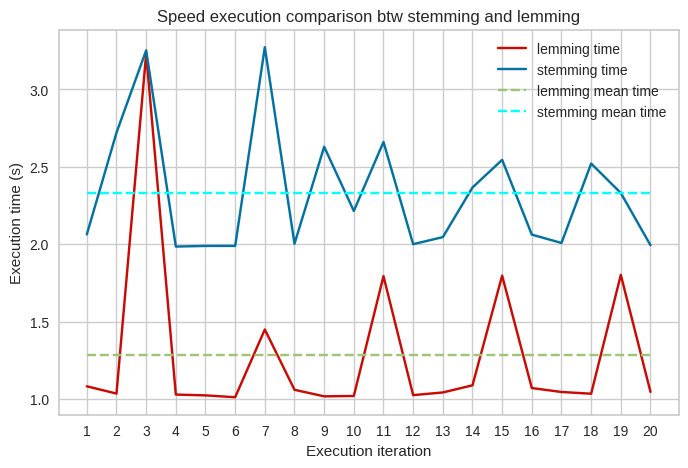

In [ ]:
evaluate_treatment_time(n_iter= 20)

On s'attendrait à ce que le lemming soit plus lent car il utilise un grand dictionnaire, mais c'est l'inverse que l'on observe.

Peut être que les données que nous manipulons sont un cas particulier ou que l'on n'a pas assez de données.

In [ ]:
def evaluate_treatment_time_wth_sample(n_iter_per_sample, min_samples, nb_point):
  """
  return graph of comparison of treatment with lemming and stemming
    - each point of lem or stem curve is the mean execution time of n_iter_per_sample iterations
    - curves evolve with increasing sample rate of the data evoving in [min_sample_rate, 1]
  n_iter_per_sample (int) as number of iteration for point of the plot
  min_sample_rate (float): btm 0 and 1, min sample rate size of the data
  nb_point (int): number of points per curve
  """

  samples_nb = np.linspace(min_samples, data.description.shape[0], nb_point)

  mean_lem, mean_stem = [], []

  for samples in tqdm(samples_nb):

    data_sample = data.description.sample(n= int(samples), random_state= 42)

    lem, stem = [], []

    for k in range(1, n_iter_per_sample + 1, 1):

      time_ref = time()
      lem_desc = [lemmer_fct(str_to_token) for str_to_token in data_sample]
      lem_time = round(time() - time_ref, 5)

      time_ref = time()
      stem_desc = [stemmer_fct(str_to_token) for str_to_token in data_sample]
      stem_time = round(time() - time_ref, 5)

      lem.append(lem_time)
      stem.append(stem_time)

    mean_lem.append(np.mean(lem))
    mean_stem.append(np.mean(stem))


  # plotting

  samples_int = [int(s) for s in samples_nb]

  plt.figure(figsize= (8, 5))
  plt.plot(samples_int, mean_lem, c= 'r', label= 'lemming mean time')
  plt.plot(samples_int, mean_stem, c= 'b', label= 'stemming mean time')
  plt.title('Speed execution comparison btw stemming and lemming with data sampling')
  plt.xlabel('data sample number')
  plt.ylabel(f'Mean execution time (s)\n({n_iter_per_sample} iterations per point)')
  plt.xticks(ticks= samples_int, labels= samples_int)
  plt.legend()
  plt.show()

100%|██████████| 10/10 [02:04<00:00, 12.46s/it]


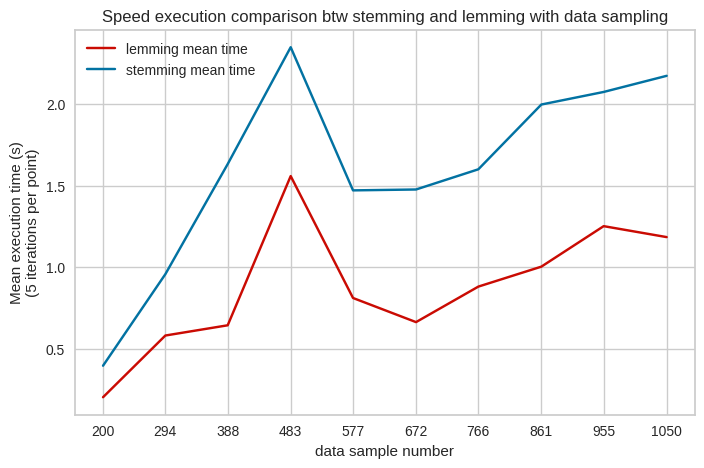

In [ ]:
evaluate_treatment_time_wth_sample(n_iter_per_sample= 5, min_samples= 200, nb_point= 10)

## Extraction

In [12]:
def plot_tsne_curve(data_transf):

  # Réduction de dimension avec t-SNE
  tsne = TSNE(n_components=2, random_state=42, perplexity=30)
  df_tsne = tsne.fit_transform(data_transf)

  # Visualisation
  plt.figure(figsize=(10, 8))
  sns.scatterplot(x= df_tsne[:, 0], y= df_tsne[:, 1], hue= data.category)
  plt.title('t-SNE Visualization')
  plt.xlabel('t-SNE Dimension 1')
  plt.ylabel('t-SNE Dimension 2')
  plt.show()

In [13]:
data

,description,image_path,category
0,Key Features of Elegance Polyester Multicolor ...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Home Furnishing
1,Specifications of Sathiyas Cotton Bath Towel (...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Baby Care
2,Key Features of Eurospa Cotton Terry Face Towe...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Baby Care
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Home Furnishing
4,Key Features of Jaipur Print Cotton Floral Kin...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Home Furnishing
...,...,...,...
1045,Oren Empower Extra Large Self Adhesive Sticker...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Baby Care
1046,Wallmantra Large Vinyl Sticker Sticker (Pack o...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Baby Care
1047,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Baby Care
1048,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,/content/drive/MyDrive/FORMATION DATASCIENTIST...,Baby Care


In [32]:
from sklearn.metrics import adjusted_rand_score

d = {data.category.unique()[i] : np.arange(7)[i] for i in range(7)}
cat_num = data.category.apply(lambda x : d[x])

def clust_evaluation(data_num, cat_num):
  """
  A partir des données textes ou image extraites, affiche les groupes réels et les groupes clusters avec l'ARI.
  """

  # Réduction de dimension avec t-SNE
  tsne = TSNE(n_components=2, random_state=42, perplexity=30)
  df_tsne = tsne.fit_transform(data_num)

  # calcul de clusters
  kmean = KMeans(n_clusters=7, random_state=42)
  kmean.fit(df_tsne)

  # calcul de l'ARI
  ari = round(adjusted_rand_score(cat_num, kmean.labels_), 4)

  # Visualisation réel et clusters
  print('ARI : ', ari)

  fig = plt.figure(figsize=(15,6))

  ax = fig.add_subplot(121)
  scatter = ax.scatter(df_tsne[:,0],df_tsne[:,1], c=cat_num, cmap='Set1')
  ax.legend(handles=scatter.legend_elements()[0], labels=data.category.unique().tolist(), loc="best", title="Categorie")
  plt.title('Représentation des produits par catégories réelles')

  ax = fig.add_subplot(122)
  scatter = ax.scatter(df_tsne[:,0],df_tsne[:,1], c=kmean.labels_, cmap='Set1')
  ax.legend(handles=scatter.legend_elements()[0], labels=set(kmean.labels_), loc="best", title="Clusters")
  plt.title('Représentation des produits par clusters')

  plt.show()

In [ ]:
data = transf_lem_update[0]

tsne = TSNE(n_components=2, random_state=42, perplexity=30)
df_tsne = tsne.fit_transform(data)

NameError: name 'kmean' is not defined

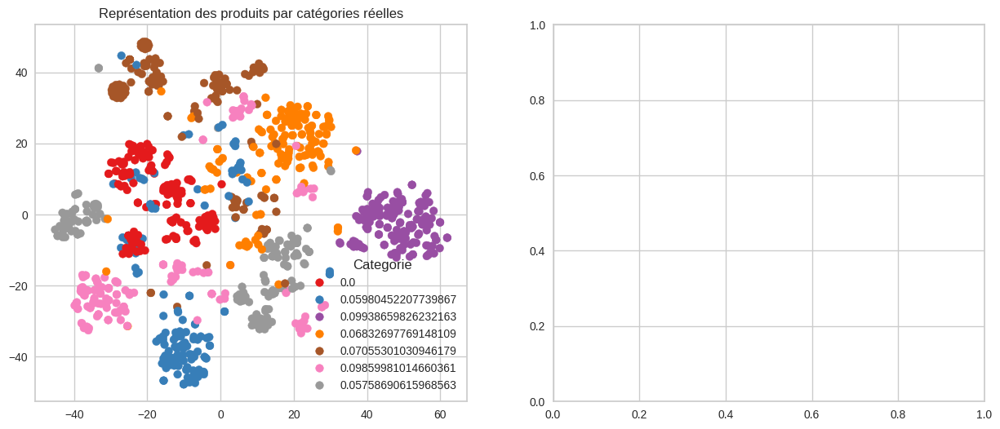

In [70]:

fig = plt.figure(figsize=(15,6))

ax = fig.add_subplot(121)
scatter = ax.scatter(df_tsne[:,0],df_tsne[:,1], c=cat_num, cmap='Set1')
ax.legend(handles=scatter.legend_elements()[0], labels=data.category.unique().tolist(), loc="best", title="Categorie")
plt.title('Représentation des produits par catégories réelles')

ax = fig.add_subplot(122)
scatter = ax.scatter(df_tsne[:,0],df_tsne[:,1], c=kmean.labels_, cmap='Set1')
ax.legend(handles=scatter.legend_elements()[0], labels=set(kmean.labels_), loc="best", title="Clusters")
plt.title('Représentation des produits par clusters')

plt.show()

In [69]:
scatter.legend_elements()[0]

### Bag-of-words

In [29]:
# fct comptage de mot simple ou tf-idf
def bow_transform(input_data, transformer):

  # transform
  time_ref = time()
  values = transformer.fit_transform(input_data)

  # temps de calcul
  timing = round(time() - time_ref, 2)

  # rétabli data
  result = pd.DataFrame(values.toarray(),
                        columns= transformer.get_feature_names_out())

  return (result, timing)

#### Tf-idf

In [ ]:
transf1 = bow_transform(data.description, TfidfVectorizer())
display(transf1[0])
print(f"\nexécution en {transf1[1]} secondes.")

,00,000,001,0021,004,005,006,0083,01,011,...,zinc,zingalalaa,zip,zipexterior,zipper,zippered,zone,zoom,zora,zyxel
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1046,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1047,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1048,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0



exécution en 0.1 secondes.


In [ ]:
transf2 = bow_transform(data.description_stem, TfidfVectorizer())
display(transf2[0])
print(f"\nexécution en {transf2[1]} secondes.")

,00,000,001,0021,004,005,006,0083,01,011,...,zikrak,zinc,zingalalaa,zip,zipexterior,zipper,zone,zoom,zora,zyxel
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1046,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1047,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1048,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0



exécution en 0.06 secondes.


In [ ]:
transf3 = bow_transform(data.description_lem, TfidfVectorizer())
display(transf3[0])
print(f"\nexécution en {transf3[1]} secondes.")

,00,000,001,0021,004,005,006,0083,01,011,...,zinc,zingalalaa,zip,zipexterior,zipper,zippered,zone,zoom,zora,zyxel
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1046,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1047,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1048,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0



exécution en 0.09 secondes.


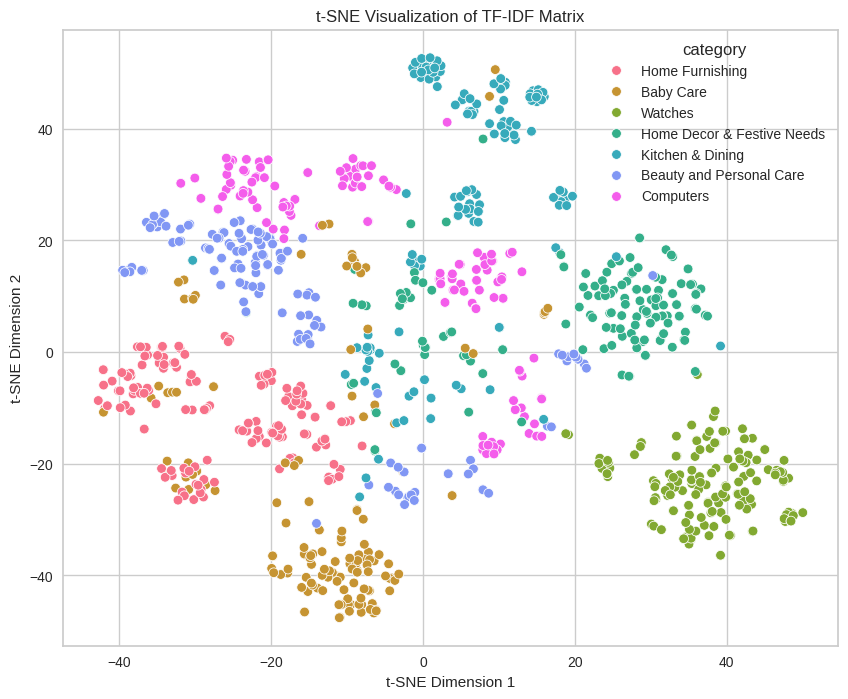

In [ ]:
plot_tsne_curve(data_transf= transf3[0])

#### Counter

In [ ]:
transf4 = bow_transform(data.description, CountVectorizer())
display(transf4[0])
print(f"\nexécution en {transf4[1]} secondes.")

,00,000,001,0021,004,005,006,0083,01,011,...,zinc,zingalalaa,zip,zipexterior,zipper,zippered,zone,zoom,zora,zyxel
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1046,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1047,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1048,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0



exécution en 0.09 secondes.


In [ ]:
transf5 = bow_transform(data.description_stem, CountVectorizer())
display(transf5[0])
print(f"\nexécution en {transf5[1]} secondes.")

,00,000,001,0021,004,005,006,0083,01,011,...,zikrak,zinc,zingalalaa,zip,zipexterior,zipper,zone,zoom,zora,zyxel
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1046,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1047,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1048,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0



exécution en 0.06 secondes.


In [ ]:
transf6 = bow_transform(data.description_lem, CountVectorizer())
display(transf6[0])
print(f"\nexécution en {transf6[1]} secondes.")

,00,000,001,0021,004,005,006,0083,01,011,...,zinc,zingalalaa,zip,zipexterior,zipper,zippered,zone,zoom,zora,zyxel
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1046,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1047,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1048,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0



exécution en 0.06 secondes.


#### Affiche 2D

##### Colorisation et numérisation des catégories

In [ ]:
# catégories de produit et leur couleurs associées pour affichage graphique
categories = data.category.unique()
colors_names = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'cyan']

# Créer un dictionnaire de couleurs pour chaque catégorie
colors = {categories[i]: colors_names[i] for i in range(len(colors_names))}

In [ ]:
# Créer un dictionnaire d'index de label pour chaque catégorie
labels_id = {categories[i]: i for i in range(len(categories))}

# colonne des label
y_label = [labels_id[data.category[i]] for i in range(data.shape[0])]

##### Affichage

In [ ]:
# Réduction de dimension avec t-SNE
tsne = TSNE(n_components=2, random_state=42)
tfidf_tsne = tsne.fit_transform(transf3[0])

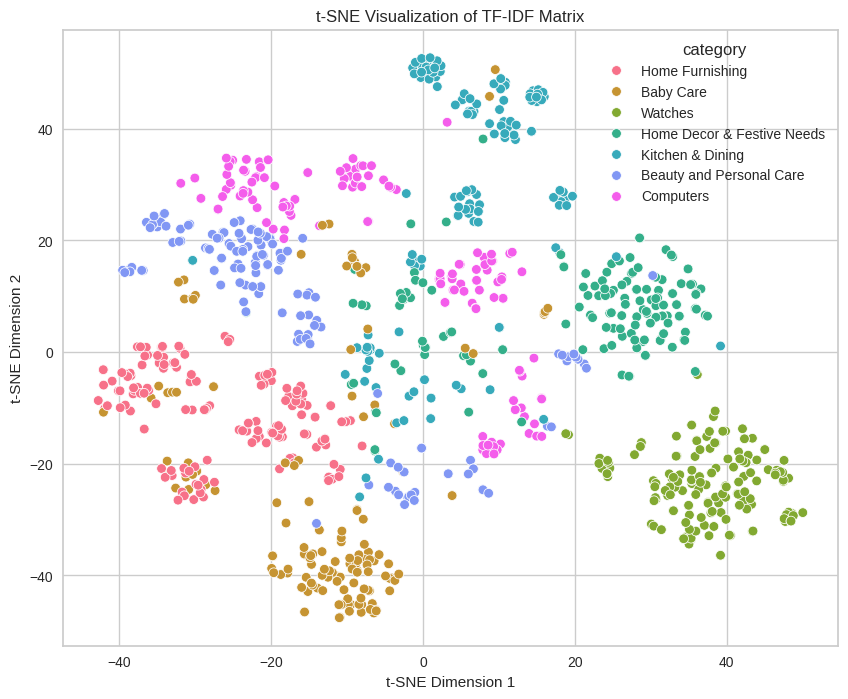

In [ ]:
# Visualisation
plt.figure(figsize=(10, 8))
sns.scatterplot(x= tfidf_tsne[:, 0], y= tfidf_tsne[:, 1], hue= data.category)
plt.title('t-SNE Visualization of TF-IDF Matrix')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

In [ ]:
def create_tsne_plot(data_transf):

  # Réduction de dimension avec t-SNE
  tsne = TSNE(n_components=2, random_state=42)
  tfidf_tsne = tsne.fit_transform(data_transf)

  # Visualisation
  fig, ax = plt.subplots(figsize=(10, 8))
  for cat in set(categories):
      plt.scatter(x=[tfidf_tsne[i][0] for i in range(data.shape[0]) if data.category[i] == cat],
                  y=[tfidf_tsne[i][1] for i in range(data.shape[0]) if data.category[i] == cat],
                  c=colors[cat], label=cat)

  plt.title('t-SNE Visualization')
  plt.xlabel('t-SNE Dimension 1')
  plt.ylabel('t-SNE Dimension 2')
  plt.legend()
  plt.show()

  # Enregistrer le graphique dans une variable
  buffer = io.BytesIO()
  canvas = FigureCanvasAgg(fig)
  canvas.print_png(buffer)
  graph_data = buffer.getvalue()

  # Charger les données binaires dans une image
  img = mpimg.imread(io.BytesIO(graph_data), format='png')

  return(img, tfidf_tsne)

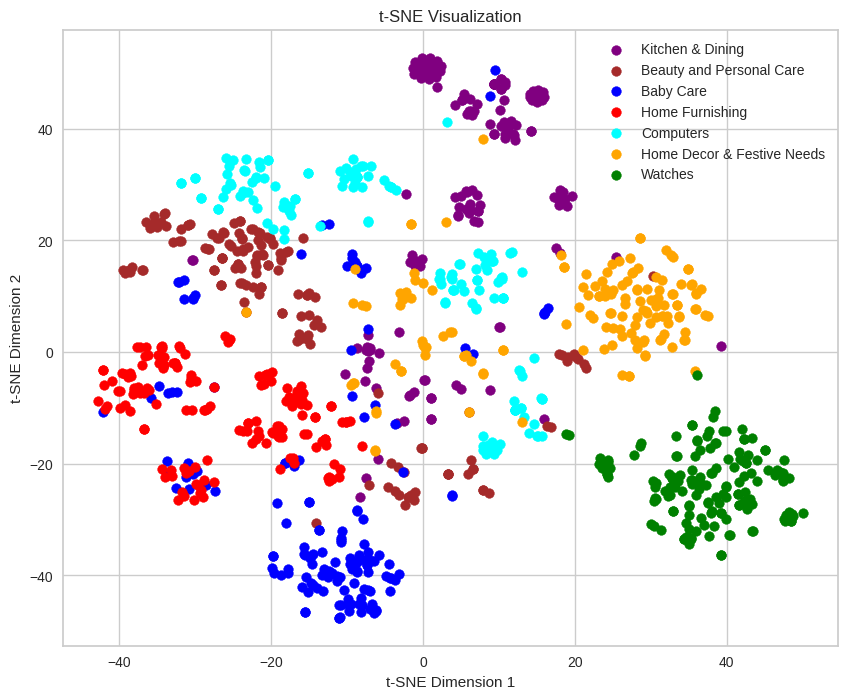

In [ ]:
img_transf3 = create_tsne_plot(data_transf= transf3[0])[0]

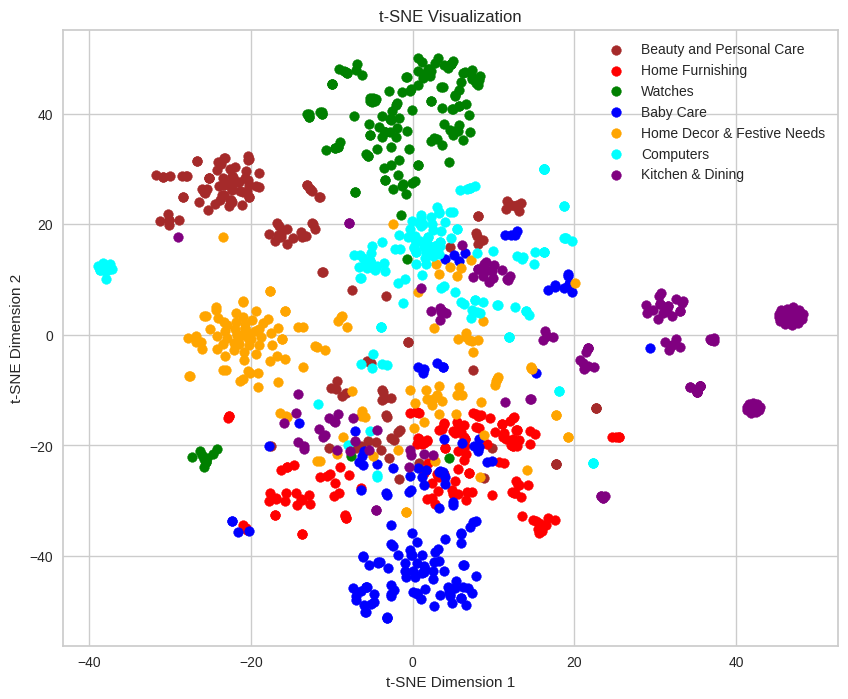

In [ ]:
img_transf6 = create_tsne_plot(data_transf= transf6[0])[0]

In [ ]:
def show_one_scatter(img, name):
  # Afficher l'image
  plt.figure(figsize= (16,8))
  plt.imshow(img)
  plt.axis('off')
  plt.title(name)
  plt.show()

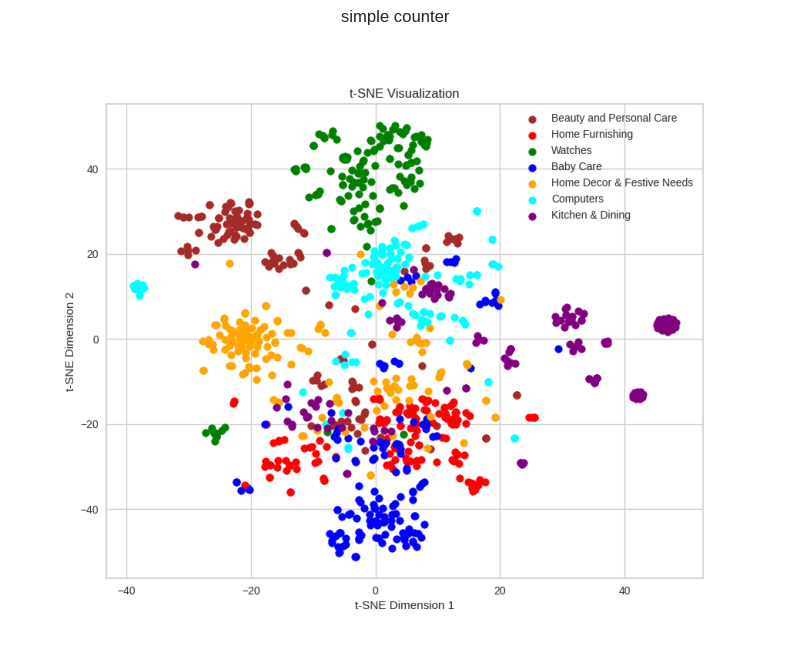

In [ ]:
show_one_scatter(img= img_transf6, name= 'simple counter')

In [ ]:
def show_two_plot(image_list, image_names):

  # Créer une figure et une grille de sous-graphiques
  fig, axs = plt.subplots(1, len(image_list), figsize=(17, 7))

  # Afficher chaque image dans un sous-graphique
  for x in range(len(image_list)):

    # Taille de l'image originale
    original_height, original_width = image_list[x].shape[0], image_list[x].shape[1]
    axs[x].imshow(image_list[x]) #, cmap='viridis'
    axs[x].set_title(image_names[x])

  # Ajouter des étiquettes et un titre global
  for ax in axs:
      ax.axis('off')  # Supprimer les axes si nécessaire

  #plt.tight_layout()
  plt.show()

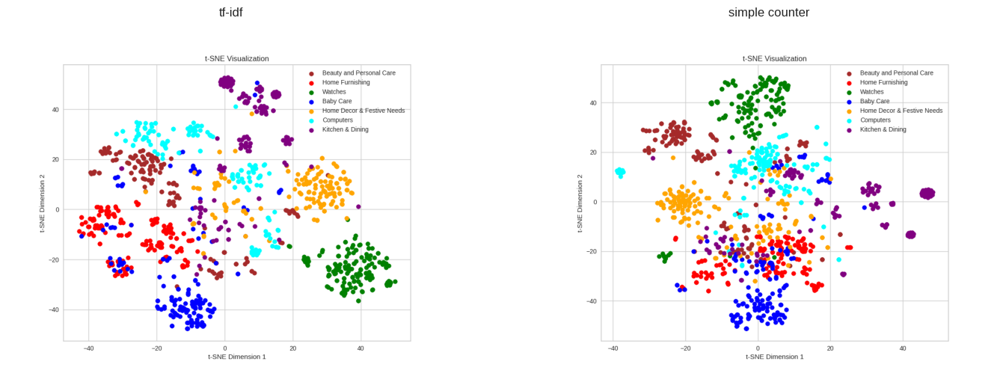

In [ ]:
# tnse to plot
image_list = [img_transf3, img_transf6]
image_names = ['tf-idf', 'simple counter']

show_two_plot(image_list, image_names)

#### Scoring

In [ ]:
silhouette_tf_idf = silhouette_score(transf3[0], y_label)
silhouette_counter = silhouette_score(transf6[0], y_label)

In [ ]:
print(f"silhouette Tf-idf = {silhouette_tf_idf}\n")
print(f"silhouette compteur de mots = {silhouette_counter}\n")

silhouette Tf-idf = 0.02971282404911209

silhouette compteur de mots = -0.06610158351033639



In [ ]:
# projections
transf3_tsne = create_tsne_plot(data_transf= transf3[0])[1]
transf6_tsne = create_tsne_plot(data_transf= transf6[0])[1]

In [ ]:
# scores
silhouette_tf_idf_tsne = silhouette_score(transf3_tsne, y_label)
silhouette_counter_tsne = silhouette_score(transf6_tsne, y_label)

print(f"silhouette Tf-idf = {silhouette_tf_idf_tsne}\n")
print(f"silhouette compteur de mots = {silhouette_counter_tsne}\n")

silhouette Tf-idf = 0.22272911667823792

silhouette compteur de mots = 0.12090429663658142



D'après le score de silhouette moyen, le TF-IDF est de meilleure qualité pour répartir les produists par catégorie.

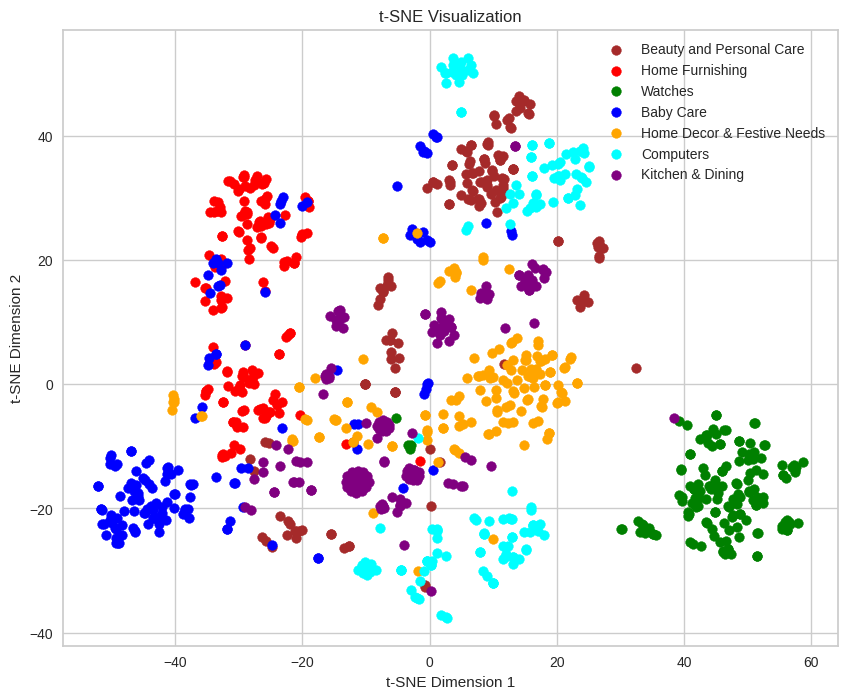

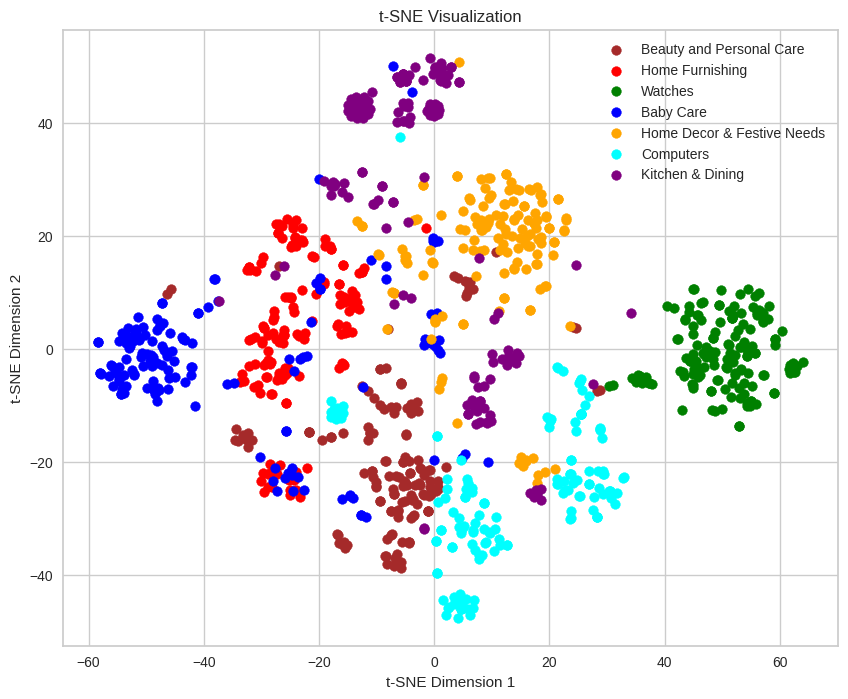

silhouette Tf-idf 1 = 0.1608181595802307

silhouette Tf-idf 2 = 0.2420206367969513



In [ ]:
# test avec tf-idf sur data brute et date stemmé
# projections
img_transf1_tsne, transf1_tsne = create_tsne_plot(data_transf= transf1[0])
img_transf2_tsne, transf2_tsne = create_tsne_plot(data_transf= transf2[0])

# scores
silhouette_tf_idf_1_tsne = silhouette_score(transf1_tsne, y_label)
silhouette_tf_idf_2_tsne = silhouette_score(transf2_tsne, y_label)

print(f"silhouette Tf-idf 1 = {silhouette_tf_idf_1_tsne}\n")
print(f"silhouette Tf-idf 2 = {silhouette_tf_idf_2_tsne}\n")

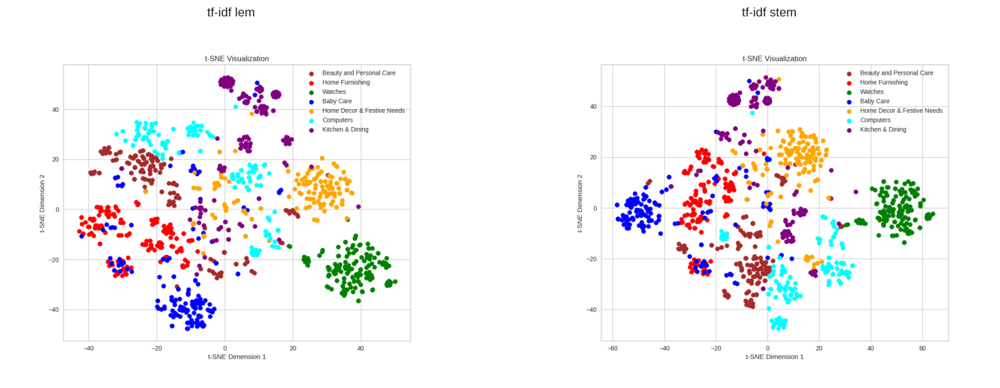

In [ ]:
# tnse to plot
image_list = [img_transf3, img_transf2_tsne]
image_names = ['tf-idf lem', 'tf-idf stem']

show_two_plot(image_list, image_names)

#### Filtrages supplémentaires

In [39]:
# comptage des occurences de chaque mot (apres filtrage stopwords et ponctuation)

# concatène tout le corpus
text_corpus = data.description_lem[0]
for i in range(1, data.shape[0]):
  text_corpus += ' ' + data.description_lem[i]

# tokenisation
token_corpus = word_tokenize(text_corpus)

# compate des occurences
corpus_occ = dict(Counter(token_corpus))

# convertion en dataframe
words_df = pd.Series(list(corpus_occ.keys()), name= 'words')
occ_df = pd.Series(list(corpus_occ.values()), name= 'occurency')

corpus_occ_df = pd.concat([words_df, occ_df], axis= 1)

In [40]:
# calcul de caractéristiques supplémetaires pour chaque mot

# liste des tokens pour chaque description
token_list = [word_tokenize(data.description_lem[i]) for i in range(data.shape[0])]

characters, contains_digit, nbr_descriptions = [], [], []

for i in tqdm(range(corpus_occ_df.shape[0])):

  chaine_val = corpus_occ_df.words[i] # le mot
  characters.append(len(chaine_val)) # longueur du mot
  if any(char.isdigit() for char in chaine_val): # True si contient chiffre
    contains_digit.append(True)
  else:
    contains_digit.append(False)

  counter = sum(1 for token in token_list if corpus_occ_df.words[i] in token) # occurence description produit
  nbr_descriptions.append(counter)

# ajout de la colonne des nb de caractères
corpus_occ_df['characters'] = characters
corpus_occ_df['contains_digit'] = contains_digit

# ajout de la colonne des nb de descriptions de produit utilisant chaque mot
corpus_occ_df['nbr_descriptions'] = nbr_descriptions

100%|██████████| 6023/6023 [01:22<00:00, 73.33it/s]


In [41]:
corpus_occ_df

,words,occurency,characters,contains_digit,nbr_descriptions
0,key,223,3,False,202
1,feature,404,7,False,267
2,elegance,11,8,False,6
3,polyester,68,9,False,28
4,multicolor,160,10,False,87
...,...,...,...,...,...
6018,uberlyfe,4,8,False,2
6019,polyvinyl,2,9,False,1
6020,film,2,4,False,1
6021,rs.1449,1,7,True,1


In [42]:
corpus_occ_df.describe()

,occurency,characters,nbr_descriptions
count,6023.000000,6023.000000,6023.000000
mean,10.008966,6.552383,6.291549
std,39.644303,2.836085,31.244342
min,1.000000,1.000000,1.000000
25%,1.000000,4.000000,1.000000
50%,2.000000,6.000000,1.000000
75%,5.000000,8.000000,3.000000
max,863.000000,32.000000,664.000000


On va créer une copie de ce tableau de mots pour isoler ce que l'on garde et ce que l'on supprimera dans notre token principal.

In [43]:
corpus_occ_df_cleaning = corpus_occ_df.copy()

In [44]:
corpus_occ_df_cleaning[corpus_occ_df_cleaning.nbr_descriptions >= 100].sort_values('nbr_descriptions', ascending= False)

,words,occurency,characters,contains_digit,nbr_descriptions
147,product,863,7,False,664
276,free,614,4,False,594
16,r,598,1,False,592
265,buy,581,3,False,576
279,delivery,567,8,False,566
272,genuine,564,7,False,564
278,cash,564,4,False,564
277,shipping,564,8,False,564
15,price,558,5,False,542
273,day,552,3,False,513


On pourrait dire qu'au-delà de 200 occurences de description les mots deviennent très (trop) génériques (pack, price, day, etc.).

En desous de cette occurence nous retrouvons des mots comme fabric, cotton, qui donne des informations sur la matière du produit par exemple ce qui serait intéressant de garder pour faire de la classification.

In [45]:
# retire les occurences description supérieures à 202 (key)
corpus_occ_df_cleaning = corpus_occ_df_cleaning[corpus_occ_df_cleaning.nbr_descriptions <= 202]

In [46]:
# examinons le nombre de mots :
# - ayant des chiffres
display(corpus_occ_df_cleaning[corpus_occ_df_cleaning.contains_digit == True])

# supprimons les
corpus_occ_df_cleaning = corpus_occ_df_cleaning[corpus_occ_df_cleaning.contains_digit == False]

,words,occurency,characters,contains_digit,nbr_descriptions
10,213,10,3,True,4
14,2,173,1,True,88
17,899,5,3,True,5
22,100,80,3,True,50
96,duster25,1,8,True,1
...,...,...,...,...,...
5984,rs.1143,1,7,True,1
6000,2-3,2,3,True,1
6010,"1,896",1,5,True,1
6021,rs.1449,1,7,True,1


In [47]:
corpus_occ_df_cleaning

,words,occurency,characters,contains_digit,nbr_descriptions
0,key,223,3,False,202
2,elegance,11,8,False,6
3,polyester,68,9,False,28
4,multicolor,160,10,False,87
5,abstract,53,8,False,44
...,...,...,...,...,...
6016,decal/sticker,2,13,False,1
6017,practice,2,8,False,1
6018,uberlyfe,4,8,False,2
6019,polyvinyl,2,9,False,1


In [48]:
# examinons le nombre de mots:
# - de 1 caractères
corpus_occ_df_cleaning[corpus_occ_df_cleaning.characters <= 1].sort_values('nbr_descriptions', ascending= False)

,words,occurency,characters,contains_digit,nbr_descriptions
86,.,101,1,False,94
189,g,84,1,False,73
183,x,138,1,False,64
744,l,87,1,False,54
760,w,45,1,False,21
506,u,14,1,False,13
3003,v,27,1,False,10
1710,’,16,1,False,10
2692,n,18,1,False,8
1560,f,15,1,False,8


Supprimons ces caractères inutiles.

In [49]:
# suppression des éléments de 1 caractères
corpus_occ_df_cleaning = corpus_occ_df_cleaning[corpus_occ_df_cleaning.characters > 1]

In [50]:
# examinons le nombre de mots:
# - de 2 caractères
corpus_occ_df_cleaning[corpus_occ_df_cleaning.characters <= 2].sort_values('nbr_descriptions', ascending= False)

,words,occurency,characters,contains_digit,nbr_descriptions
11,cm,567,2,False,196
785,'s,317,2,False,112
606,ml,119,2,False,62
750,``,230,2,False,59
95,id,54,2,False,54
...,...,...,...,...,...
3168,hr,1,2,False,1
3210,mn,1,2,False,1
3560,cl,4,2,False,1
3723,hg,3,2,False,1


Les quelques éléments potentiellement intéressants sont des unités (cm, kg, mb, cl, etc.). On pourrait cependant nuancer leur importance vis-à-vis d'autres mot-clès supérieur ou égal à 3 caractères.

Nous allons supprimer les éléments de 2 caractères également.

In [51]:
# suppression des mots de 2 caractères
corpus_occ_df_cleaning = corpus_occ_df_cleaning[corpus_occ_df_cleaning.characters > 2]

In [52]:
corpus_occ_df_cleaning.sort_values('occurency', ascending= False)

,words,occurency,characters,contains_digit,nbr_descriptions
813,mug,457,3,False,75
264,watch,355,5,False,153
784,baby,321,4,False,98
94,set,308,3,False,158
108,cotton,297,6,False,128
...,...,...,...,...,...
2882,netbook,1,7,False,1
2883,layout.note-this,1,16,False,1
2889,embellishment,1,13,False,1
2890,headband,1,8,False,1


In [53]:
corpus_occ_df_cleaning.describe()

,occurency,characters,nbr_descriptions
count,4538.000000,4538.000000,4538.000000
mean,8.990084,6.887175,4.982151
std,24.677709,2.618504,13.119074
min,1.000000,3.000000,1.000000
25%,1.000000,5.000000,1.000000
50%,2.000000,7.000000,1.000000
75%,6.000000,8.000000,3.000000
max,457.000000,32.000000,202.000000


In [54]:
# création des ensembles de mots
set_corpus_1 = set(corpus_occ_df.words)
set_corpus_cleaned = set(corpus_occ_df_cleaning.words)

# récupération des mots à filtrer
stop_words_update = set_corpus_1 - set_corpus_cleaned

# mise à jour de l'ensemble stop words
stop_words.update(stop_words_update)

#### Réévaluation

In [27]:
# traitement avec la mise à jour
time_ref = time()
lem_desc = [lemmer_fct(str_to_token) for str_to_token in data.description]
lem_time = round(time() - time_ref, 5)

# ajout dans une nouvelle colonne
data['update_description_lem'] = lem_desc

print(f'lemming de {data.shape[0]} descriptions en {lem_time} s.')

lemming de 1050 descriptions en 2.08578 s.


In [30]:
data.category.unique()

array(['Home Furnishing', 'Baby Care', 'Watches',
       'Home Decor & Festive Needs', 'Kitchen & Dining',
       'Beauty and Personal Care', 'Computers'], dtype=object)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


ARI :  0.537


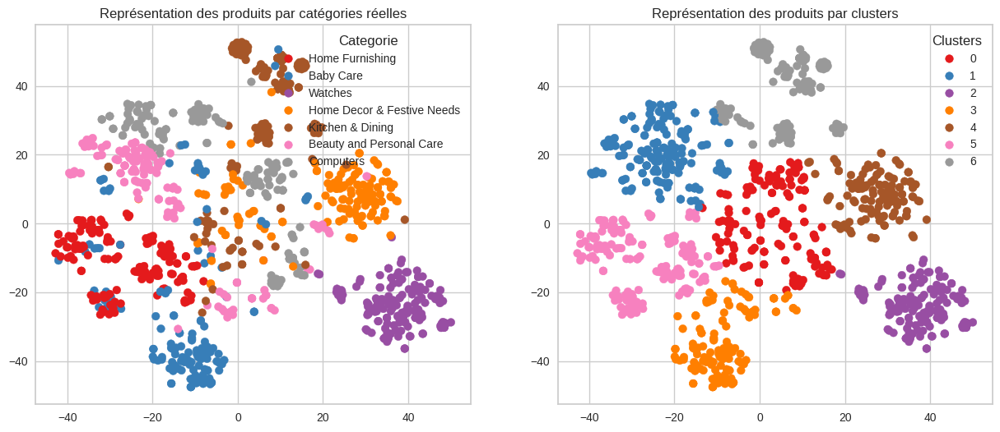

In [33]:
transf_lem_update = bow_transform(data.update_description_lem, TfidfVectorizer())
clust_evaluation(transf_lem_update[0], cat_num)

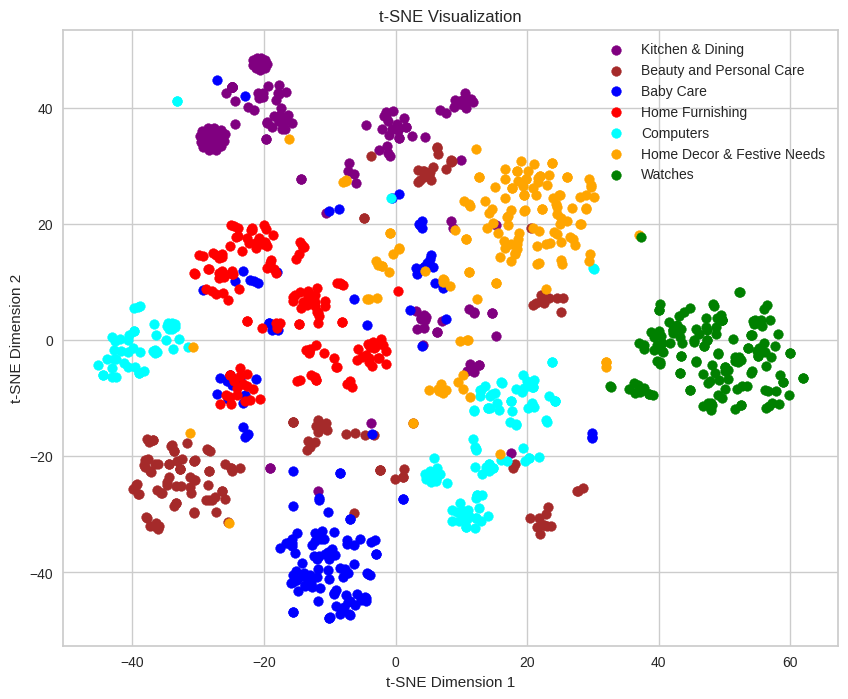

In [ ]:
# tf-idf et tsne
transf_lem_update = bow_transform(data.update_description_lem, TfidfVectorizer())
tsne_transf_lem_update = create_tsne_plot(data_transf= transf_lem_update[0])

In [ ]:
# scores
silhouette_tf_idf_lem_update_tsne = silhouette_score(tsne_transf_lem_update[1], y_label)

print(f"silhouette Tf-idf 1 = {silhouette_tf_idf_lem_update_tsne}.")

silhouette Tf-idf 1 = 0.212273508310318.


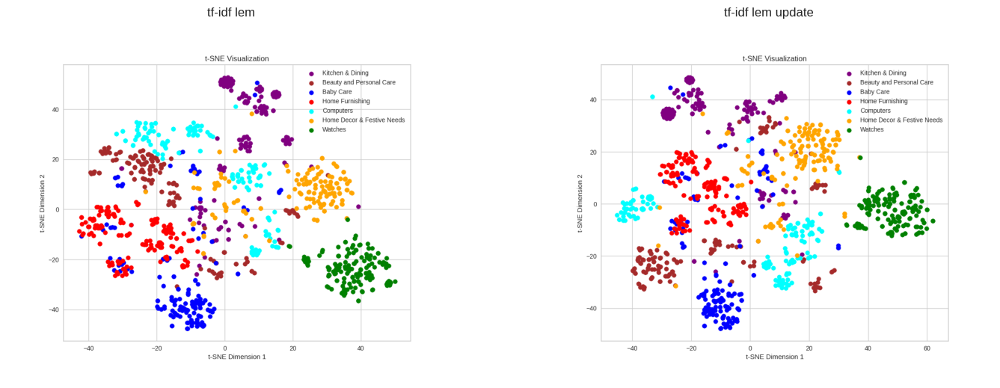

In [ ]:
# tnse to plot
image_list = [img_transf3, tsne_transf_lem_update[0]]
image_names = ['tf-idf lem', 'tf-idf lem update']

show_two_plot(image_list, image_names)

In [ ]:
def tokeniser_fct_2(str_to_token): # data_source.description[0]

  # texte à prétraiter
  text = str_to_token

  # Tokenization
  tokens = word_tokenize(text)

  # Suppression de la ponctuation et des mots de liaison, mise en minuscules
  filtered_tokens = [word.lower() for word in tokens if word.lower() not in stop_words and word.lower() not in punctuation]

  # résultat cleané
  text_cleaned = ' '.join(filtered_tokens)

  return filtered_tokens

In [ ]:
# grille param
param = {
    'ngram_range' : [(1, 1), (1, 2), (2, 2), (1, 3)],
    'max_df' : [0.3, 0.1, 0.05, 0.01],
    'min_df' : [1, 5, 20],
    'max_features' : [None, 3000, 2000]
}

In [ ]:
# grille param
param_1 = {
    'ngram_range' : [(1, 2), (1, 3)],
    'max_df' : [250, 40],
    'min_df' : [1, 20],
    'max_features' : [None]
}

def grid_search_tf_idf(param):

  silhouette_list, param_config = [], []

  for a in param['ngram_range']:
    for b in tqdm(param['max_df']):
      for c in param['min_df']:
        for d in param['max_features']:

          # Initialisation du TfidfVectorizer avec des hyperparamètres spécifiques
          vectorizer = TfidfVectorizer(
              ngram_range= a,  # Utilisation de unigrammes et de bigrammes
              max_df= b,          # Ignorer les mots apparaissant dans plus de 80% des documents
              min_df= c,            # Ignorer les mots apparaissant dans moins de 1 document
              max_features= d,   # Aucune limite sur le nombre maximal de fonctionnalités
          )

          transf_test = bow_transform(data.update_description_lem, vectorizer)[0]

          tsne = TSNE(n_components=2, random_state=42)
          tsne_transf_test = tsne.fit_transform(transf_test) # Réduction de dimension avec t-SNE

          # scores
          silhouette_list.append(silhouette_score(tsne_transf_test, y_label))
          param_config.append((f'ngram_range = {a}',f'max_df = {b}',f'min_df = {c}',f'max_features = {d}'))

  resultat = zip(silhouette_list, param_config)
  best = max(list(resultat))
  print(f'\nmeilleure silhouette : {best[0]}\navec : \n{best[1]}')

In [ ]:
# grille param
param_1 = {
    'ngram_range' : [(1, 2), (1, 3)],
    'max_df' : [250, 40],
    'min_df' : [1, 20],
    'max_features' : [None]
}

grid_search_tf_idf(param_1)
# best = 'ngram_range = (1, 2)', 'max_df = 250', 'min_df = 1', 'max_features = None'
# silhouette = 0.27

In [ ]:
# grille param
param_2 = {
    'ngram_range' : [(1, 2)],
    'max_df' : [1000, 500, 250, 180],
    'min_df' : [1],
    'max_features' : [None]
}

grid_search_tf_idf(param_2)

In [ ]:
# grille param
param_3 = {
    'ngram_range' : [(1, 2)],
    'max_df' : [250],
    'min_df' : [1],
    'max_features' : [None, 4000, 3000, 2000, 1000]
}

grid_search_tf_idf(param_3)

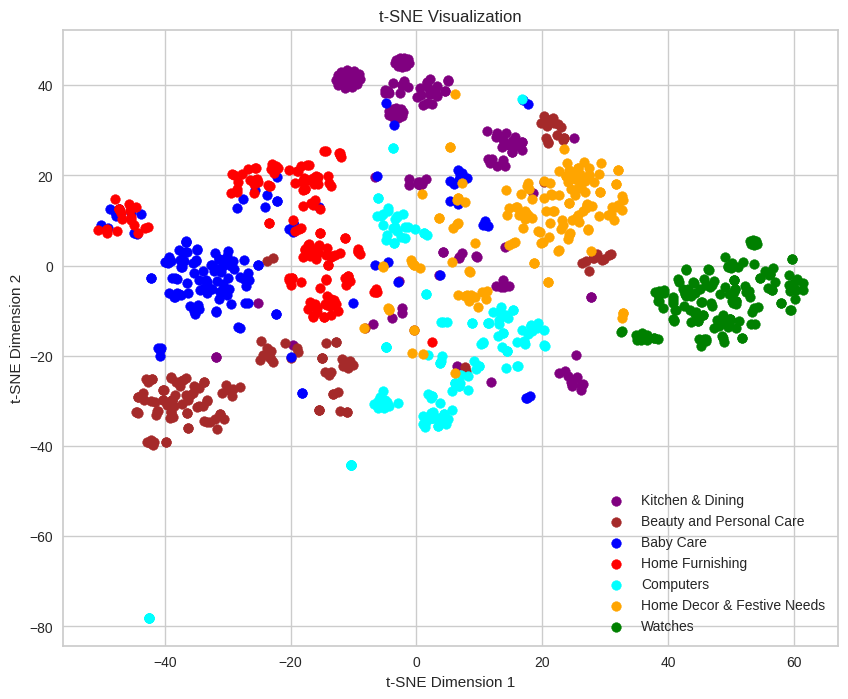

In [ ]:
# affichage de la meilleure config
vectorizer = TfidfVectorizer(
              ngram_range= (1, 2),  # Utilisation de unigrammes et de bigrammes
              max_df= 250,          # Ignorer les mots apparaissant dans plus de 250 des documents
              min_df= 1,            # Ignorer les mots apparaissant dans moins de 1 document
              max_features= None,   # Aucune limite sur le nombre maximal de fonctionnalités
          )

transf_tf_idf_best = bow_transform(data.update_description_lem, vectorizer)[0]
img_best = create_tsne_plot(data_transf= transf_tf_idf_best)[0]

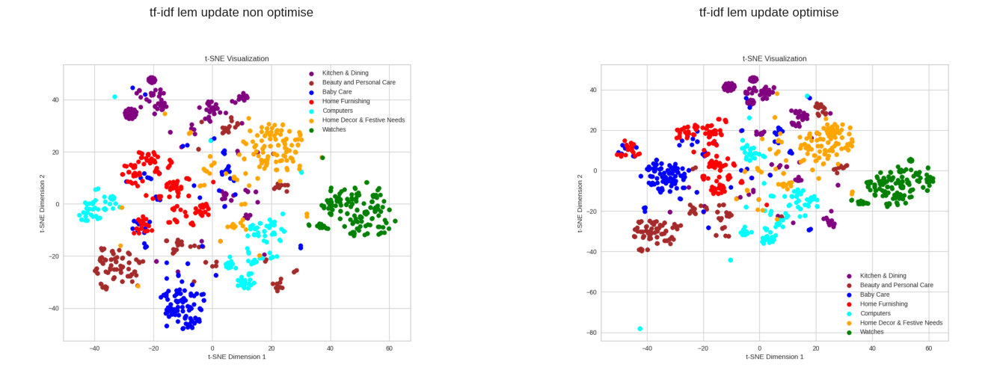

In [ ]:
# tnse to plot
image_list = [tsne_transf_lem_update[0], img_best]
image_names = ['tf-idf lem update non optimise', 'tf-idf lem update optimise']

show_two_plot(image_list, image_names)

#### Statistique des descriptions

In [ ]:
nb_words, nb_unique = [], []
lemmer = WordNetLemmatizer()
for i in range(data.shape[0]):
  token = tokeniser_fct(data.description[i])[0]
  lemmed_token = [lemmer.lemmatize(word) for word in token]
  nb_words.append(len(lemmed_token))
  nb_unique.append(pd.Series(lemmed_token).nunique())

nb_words_serie = pd.Series(nb_words, name= 'nb_words')
nb_unique_serie = pd.Series(nb_unique, name= 'nb_unique')
token_df = pd.concat([nb_words_serie, nb_unique_serie], axis = 1)
print(token_df)

      nb_words  nb_unique
0          133         89
1           51         30
2          134         78
3           93         41
4          129         63
...        ...        ...
1045       218         90
1046       140         57
1047        18         10
1048        12          6
1049        10          6

[1050 rows x 2 columns]


In [ ]:
token_df.describe()

,nb_words,nb_unique
count,1050.000000,1050.000000
mean,41.511429,23.809524
std,46.319798,24.257750
min,3.000000,3.000000
25%,10.000000,8.000000
50%,21.000000,13.500000
75%,61.000000,31.000000
max,331.000000,184.000000


### Word embeding

#### Word2Vec

100%|██████████| 1050/1050 [00:00<00:00, 4581.32it/s]


0.3516044


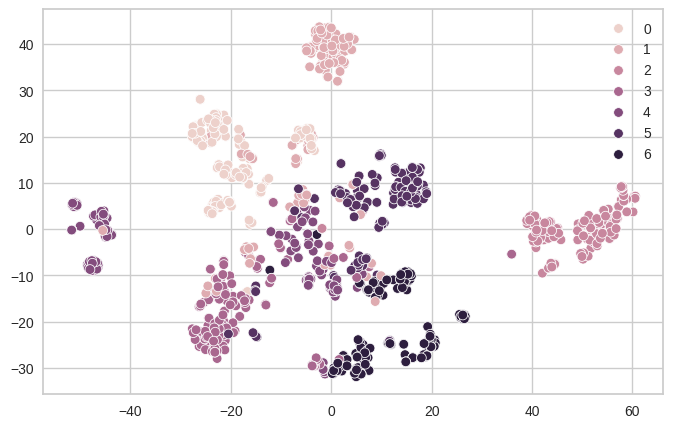

In [ ]:
# crée la list de token
tokens = []
lemmer = WordNetLemmatizer()
for i in range(data.shape[0]):
  token = tokeniser_fct(data.description[i])[0]
  lemmed_token = [lemmer.lemmatize(word) for word in token]
  tokens.append(lemmed_token)

# Entraîner le modèle Word2Vec
model_wv = Word2Vec(tokens, vector_size=55, window=35, min_count=1, sg=1)

# calcul le vecteur moyen pour chaque description produit
document_vectors = []
for token in tqdm(tokens):
    text_vector = np.mean([model_wv.wv[word] for word in token if word in model_wv.wv], axis=0)
    document_vectors.append(text_vector)

document_vectors = np.array(document_vectors)

# reduction en 2 dimentions de l'espace de données
tsne = TSNE(n_components=2, random_state=42)
tsne_word2vec = tsne.fit_transform(document_vectors) # Réduction de dimension avec t-SNE

# scores
silhouette_word2vec = silhouette_score(tsne_word2vec, y_label)

# affichage 2D des groupements
plt.figure(figsize= (8, 5))
sns.scatterplot(x= tsne_word2vec[:, 0], y= tsne_word2vec[:, 1], hue= y_label)

print(silhouette_word2vec)

In [ ]:
# grille param
param_wv = {
    'vector_size' : [10, 40, 60, 100],
    'window' : [3, 5],
    'min_count' : [1, 2],
    'sg' : [0, 1]
}

def grid_search_wv(param):

  # liste des noms de paramètres
  param_names = list(param_wv.keys())

  # crée la list de token
  tokens = []
  lemmer = WordNetLemmatizer()
  for i in range(data.shape[0]):
    token = tokeniser_fct(data.description[i])[0]
    lemmed_token = [lemmer.lemmatize(word) for word in token]
    tokens.append(lemmed_token)

  silhouette_list, param_config = [], []

  for a in tqdm(param[param_names[0]]):
    for b in param[param_names[1]]:
      for c in param[param_names[2]]:
        for d in param[param_names[3]]:

          # Entraîner le modèle Word2Vec
          model_wv = Word2Vec(tokens, vector_size=a, window=b, min_count=c, sg=d)

          # calcul le vecteur moyen pour chaque description produit
          document_vectors = []
          for token in tqdm(tokens):
              text_vector = np.mean([model_wv.wv[word] for word in token if word in model_wv.wv], axis=0)
              document_vectors.append(text_vector)

          document_vectors = np.array(document_vectors)

          # reduction en 2 dimentions de l'espace de données
          tsne = TSNE(n_components=2, random_state=42)
          tsne_word2vec = tsne.fit_transform(document_vectors) # Réduction de dimension avec t-SNE

          # scores
          silhouette_list.append(silhouette_score(tsne_word2vec, y_label))
          param_config.append((f'{param_names[0]} = {a}',f'{param_names[1]} = {b}',f'{param_names[2]} = {c}',f'{param_names[3]} = {d}'))

  resultat = zip(silhouette_list, param_config)
  best = max(list(resultat))
  print(f'\nmeilleure silhouette : {best[0]}\navec : \n{best[1]}')

In [ ]:
grid_search_wv(param_wv)
# meilleure silhouette : 0.16320617496967316
# avec :
# ('vector_size = 10', 'window = 5', 'min_count = 1', 'sg = 1')

In [ ]:
# grille param
param_wv_2 = {
    'vector_size' : [10, 15, 20],
    'window' : [4, 5],
    'min_count' : [1],
    'sg' : [1]
}

grid_search_wv(param_wv_2)
# meilleure silhouette : 0.1706637144088745
# avec :
# ('vector_size = 20', 'window = 5', 'min_count = 1', 'sg = 1')

In [ ]:
# grille param
param_wv_3 = {
    'vector_size' : [20, 25, 30],
    'window' : [5, 6],
    'min_count' : [1],
    'sg' : [1]
}

grid_search_wv(param_wv_3)
# meilleure silhouette : 0.1914697289466858
# avec :
# ('vector_size = 30', 'window = 6', 'min_count = 1', 'sg = 1')

In [ ]:
# grille param
param_wv_4 = {
    'vector_size' : [30, 35, 40],
    'window' : [5, 6, 7],
    'min_count' : [1],
    'sg' : [1]
}

grid_search_wv(param_wv_4)
# meilleure silhouette : 0.20793184638023376
# avec :
# ('vector_size = 40', 'window = 7', 'min_count = 1', 'sg = 1')

In [ ]:
# grille param
param_wv_5 = {
    'vector_size' : [40, 50, 60],
    'window' : [7, 10, 13],
    'min_count' : [1],
    'sg' : [1]
}

grid_search_wv(param_wv_5)
# meilleure silhouette : 0.2768802344799042
# avec :
# ('vector_size = 40', 'window = 13', 'min_count = 1', 'sg = 1')

In [ ]:
# grille param
param_wv_6 = {
    'vector_size' : [40, 45],
    'window' : [13, 18, 25],
    'min_count' : [1],
    'sg' : [1]
}

grid_search_wv(param_wv_6)
# meilleure silhouette : 0.3227902948856354
# avec :
# ('vector_size = 45', 'window = 25', 'min_count = 1', 'sg = 1')

In [ ]:
# grille param
param_wv_7 = {
    'vector_size' : [45, 50, 55, 60],
    'window' : [18, 25, 30, 35],
    'min_count' : [1],
    'sg' : [1]
}

grid_search_wv(param_wv_7)
# meilleure silhouette : 0.34173643589019775
# avec :
# ('vector_size = 55', 'window = 35', 'min_count = 1', 'sg = 1')

In [ ]:
# grille param
param_search = {
    'vector_size' : [50, 70, 90, 100],
    'window' : [5, 15, 25, 35, 45, 55, 65, 75]
}

# crée la list de token
tokens = []
lemmer = WordNetLemmatizer()
for i in range(data.shape[0]):
  token = tokeniser_fct(data.description[i])[0]
  lemmed_token = [lemmer.lemmatize(word) for word in token]
  tokens.append(lemmed_token)

def silhouette_wv(tokens, vector_size, window):

  # Entraîner le modèle Word2Vec
  model_wv = Word2Vec(tokens, vector_size=vector_size, window=window, min_count=1, sg=1)

  # calcul le vecteur moyen pour chaque description produit
  document_vectors = []
  for token in tqdm(tokens):
      text_vector = np.mean([model_wv.wv[word] for word in token if word in model_wv.wv], axis=0)
      document_vectors.append(text_vector)

  document_vectors = np.array(document_vectors)

  # reduction en 2 dimentions de l'espace de données
  tsne = TSNE(n_components=2, random_state=42)
  tsne_word2vec = tsne.fit_transform(document_vectors) # Réduction de dimension avec t-SNE

  # scores
  silhouette = silhouette_score(tsne_word2vec, y_label)

  return silhouette

In [ ]:
# optimisation de silhouette sur vector_size et window
silh = []
for v in param_search['vector_size']:
  for w in param_search['window']:
    silh.append(silhouette_wv(tokens, v, w))

100%|██████████| 1050/1050 [00:00<00:00, 8087.85it/s]


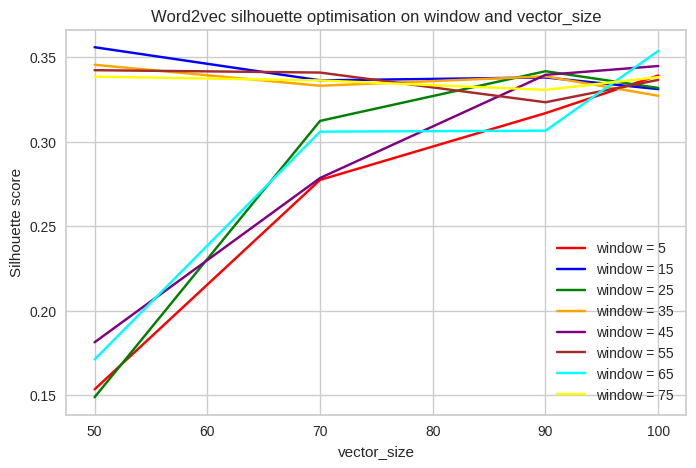

In [ ]:
plt.figure(figsize= (8, 5))
nb_v = len(param_search['vector_size'])
colors_names_2 = colors_names.append('yellow')
wind_val = param_search['window']
for w in range(len(param_search['window'])):
  silh_w = silh[w * nb_v : (w + 1) * nb_v]
  plt.plot(param_search['vector_size'], silh_w, label= f'window = {wind_val[w]}', c = colors_names[w])

plt.title('Word2vec silhouette optimisation on window and vector_size')
plt.xlabel('vector_size')
plt.ylabel('Silhouette score')
plt.legend()
plt.show()

Meilleur modèle word2vec.

In [ ]:
# Entraîner le modèle Word2Vec
model_wv = Word2Vec(tokens, vector_size=100, window=15, min_count=1, sg=1)

# calcul le vecteur moyen pour chaque description produit
document_vectors = []
for token in tqdm(tokens):
    text_vector = np.mean([model_wv.wv[word] for word in token if word in model_wv.wv], axis=0)
    document_vectors.append(text_vector)

document_vectors = np.array(document_vectors)

# reduction en 2 dimentions de l'espace de données
tsne = TSNE(n_components=2, random_state=42)
tsne_word2vec = tsne.fit_transform(document_vectors) # Réduction de dimension avec t-SNE

# scores
silhouette = silhouette_score(tsne_word2vec, y_label)
print(silhouette)

100%|██████████| 1050/1050 [00:00<00:00, 3721.84it/s]


0.2904155


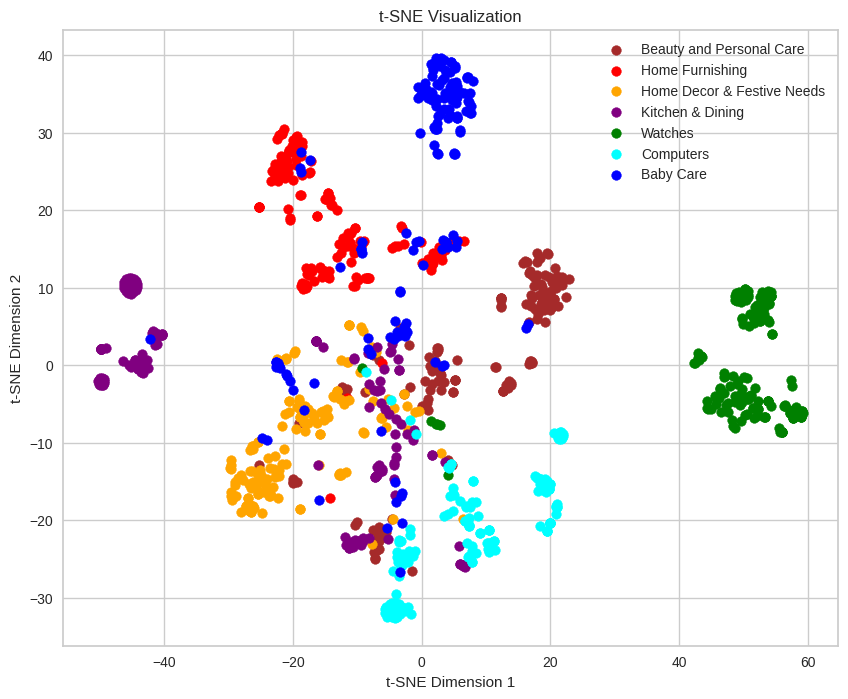

In [ ]:
img_wv_1 = create_tsne_plot(data_transf= document_vectors)[0]

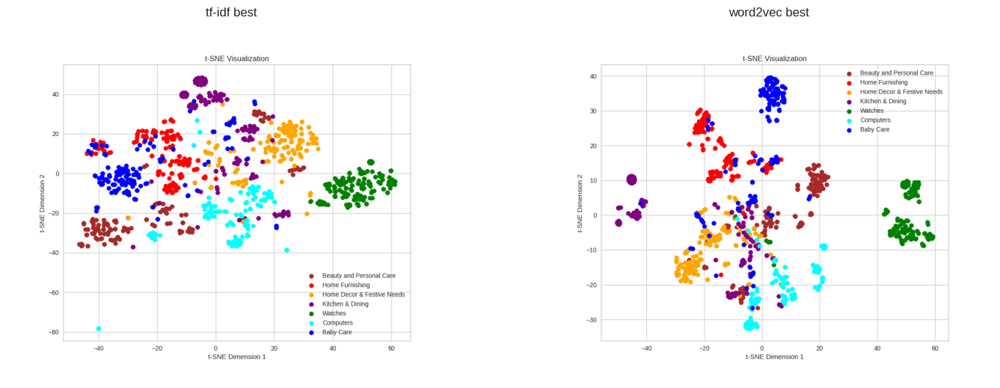

In [ ]:
# tnse to plot
image_list = [img_best, img_wv_1]
image_names = ['tf-idf best', 'word2vec best']

show_two_plot(image_list, image_names)

#### BERT

In [ ]:
from transformers import BertTokenizer, BertModel
import torch

# Charger le modèle BERT pré-entraîné et le tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model_bert = BertModel.from_pretrained('bert-base-uncased')

# Exemple de phrase
text = "Here is some text to encode."

# Prétraitement du texte pour BERT
inputs = tokenizer(text, return_tensors='pt', padding=True, truncation=True)

# Inférence avec BERT
outputs = model_bert(**inputs)

# Récupérer la représentation vectorielle du [CLS] token
embeddings = outputs.last_hidden_state[:, 0, :]

# Afficher la représentation vectorielle
print(embeddings)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tensor([[-9.9784e-02, -7.6800e-02, -1.5845e-01, -1.7010e-01, -3.0392e-01,
         -4.0865e-01,  9.1144e-02,  5.4762e-01, -5.0469e-02, -2.4483e-02,
          8.4607e-02, -2.7844e-02, -8.8867e-03,  5.5392e-02,  7.5103e-02,
         -3.1579e-02, -3.9371e-01,  5.8929e-01,  2.6590e-01, -1.1111e-01,
         -5.0403e-03, -4.2517e-01, -2.9553e-01, -1.6943e-01,  4.7963e-02,
         -1.2657e-01, -1.4065e-01, -8.2278e-02, -2.9148e-01, -1.4687e-01,
         -1.8848e-01,  2.4974e-01, -1.3803e-01, -1.7013e-01,  3.9196e-01,
         -9.6912e-02,  2.2323e-01, -6.2378e-02,  1.7874e-01, -1.5832e-01,
         -2.2956e-01, -3.3768e-02,  3.3577e-01, -3.7898e-02,  1.8134e-01,
         -3.8414e-01, -2.6595e+00, -2.2492e-01, -1.6466e-01, -2.6877e-01,
          1.6072e-01,  1.5575e-02,  3.1059e-01,  3.6076e-01,  1.7248e-01,
          3.3141e-01, -3.5336e-01,  4.6798e-01,  1.3596e-01,  9.3747e-02,
          8.5197e-02,  6.5107e-02, -2.1383e-01, -2.8544e-03, -3.4634e-02,
          9.2717e-02, -1.0528e-01,  1.

In [ ]:
# Exemple de phrase
text = [
    "This is a test sentence.",
    "Another example sentence."
    ]

# Prétraitement du texte pour BERT
inputs = tokenizer(text, return_tensors='pt', padding=True, truncation=True)

# Inférence avec BERT
outputs = model_bert(**inputs)

# Récupérer la représentation vectorielle du [CLS] token
embeddings = outputs.last_hidden_state[:, 0, :]

# Afficher la représentation vectorielle
print(embeddings)

tensor([[-0.0611,  0.0040, -0.2804,  ..., -0.4055,  0.1335,  0.6218],
        [-0.2924, -0.3253, -0.3886,  ..., -0.2868,  0.2157,  0.6433]],
       grad_fn=<SliceBackward0>)


In [ ]:
embeddings.shape

torch.Size([2, 768])

In [ ]:
# construction de la liste des descriptions
descriptions = []
for desc in data.description:
  descriptions.append(desc)

descriptions

In [ ]:
# Prétraitement du texte pour BERT
inputs = tokenizer(descriptions, return_tensors='pt', padding=True, truncation=True)

# Inférence avec BERT
outputs = model_bert(**inputs)

# Récupérer la représentation vectorielle du [CLS] token
embeddings = outputs.last_hidden_state[:, 0, :].detach().numpy()

In [ ]:
embeddings.shape

In [ ]:
data_plot_bert_1 = create_tsne_plot(data_transf= embeddings)

In [ ]:
data_plot_bert_1[0]

In [ ]:
data_plot_bert_1[1]

array([[ 27.360611 , -10.379973 ],
       [ 17.298601 , -15.698991 ],
       [ 22.355167 , -14.445412 ],
       ...,
       [ -2.2668087,  39.07986  ],
       [ -4.1679707,  39.784225 ],
       [ -2.3593383,  39.19534  ]], dtype=float32)

In [ ]:
# scores
silhouette_bert_tsne = silhouette_score(data_plot_bert_1[1], y_label)
print(f"silhouette Tf-idf = {silhouette_bert_tsne}\n")

In [ ]:
# Charger le tokenizer et le modèle BERT
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

text = "Your input text here."
tokens = tokenizer.tokenize(text)

input_ids = tokenizer.convert_tokens_to_ids(tokens)

input_ids = [tokenizer.cls_token_id] + input_ids + [tokenizer.sep_token_id]

input_ids_tensor = torch.tensor([input_ids])

with torch.no_grad():
    outputs = model(input_ids_tensor)
    embeddings = outputs[0]


In [ ]:
"""
layer linear : comment fonctionne (succetion regr lin)
Les optimiseur : stockastic gradien descend, adam (best), etc
  learning_rate (dynamique avec adam) : pas d'appentissage du parametre

  couche de pooling, normalisation, drop_out :

transfert learning : d'un modele qui a deja appris
  juste rentraine les fully layers (les dernieres)


BERT = categorie des transformers
  1 partie encoder
  1 partie decoder

lire

voir huggingface vs chatgpt
"""

"\nlayer linear : comment fonctionne (succetion regr lin)\nLes optimiseur : stockastic gradien descend, adam (best), etc\n  learning_rate (dynamique avec adam) : pas d'appentissage du parametre\n\n  couche de pooling, normalisation, drop_out :\n\ntransfert learning : d'un modele qui a deja appris\n  juste rentraine les fully layers (les dernieres)\n\n\nBERT = categorie des transformers\n  1 partie encoder\n  1 partie decoder\n\nlire\n\nvoir huggingface vs chatgpt\n"

#### USE

In [ ]:
import tensorflow_hub as hub
import tensorflow as tf

# Charger le modèle Universal Sentence Encoder (USE)
use_model = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

# Exemple de phrases
sentences = [
    "This is a test sentence.",
    "Another example sentence."
]

# Encoder les phrases avec USE
embeddings = use_model(sentences)

# Afficher les embeddings
print(embeddings)


tf.Tensor(
[[ 0.04748861 -0.04986645 -0.01711427 ... -0.07618006 -0.01122031
   0.06651668]
 [ 0.03328454  0.01292921 -0.00019189 ...  0.00619354 -0.03964062
   0.06681268]], shape=(2, 512), dtype=float32)


In [ ]:
embeddings.numpy()

array([[ 0.04748861, -0.04986645, -0.01711427, ..., -0.07618006,
        -0.01122031,  0.06651668],
       [ 0.03328454,  0.01292921, -0.00019189, ...,  0.00619354,
        -0.03964062,  0.06681268]], dtype=float32)

In [ ]:
def use_desc_to_vector(desc):
  # Encoder les phrases avec USE
  embeddings = use_model(desc).numpy()
  return embeddings

In [ ]:
vectors_use = use_desc_to_vector(data.description)

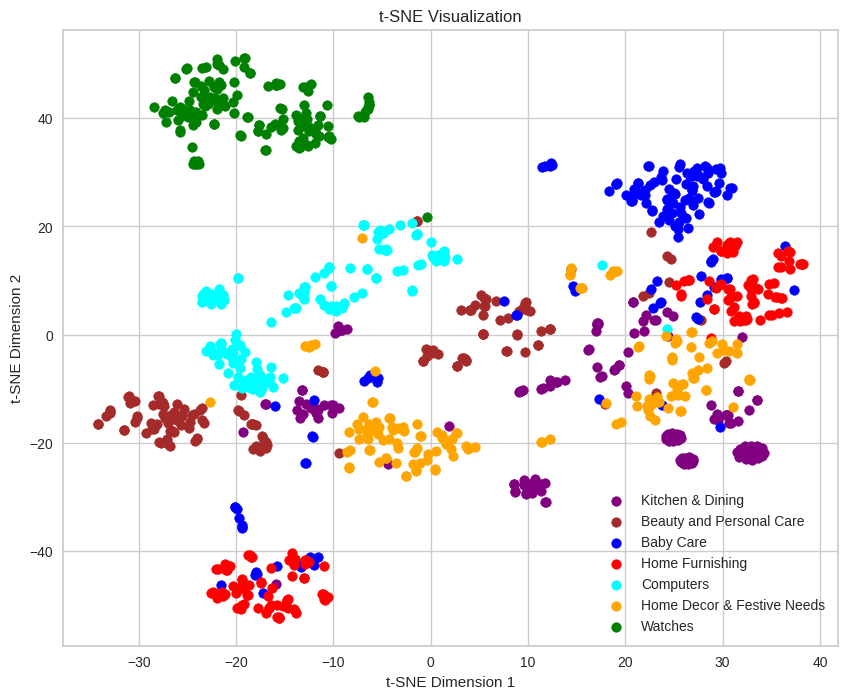

In [ ]:
data_plot_use_1 = create_tsne_plot(data_transf= vectors_use)

In [ ]:
im_use_1 = data_plot_use_1[0]
tsne_use_1 = data_plot_use_1[1]
# scores
silhouette_use_tsne = silhouette_score(tsne_use_1, y_label)
print(f"silhouette Tf-idf = {silhouette_use_tsne}\n")

silhouette Tf-idf = 0.16343875229358673



# Extraction de features images

## SIFT et ORB

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from sklearn.preprocessing import StandardScaler

In [ ]:
# Feature extractors
sift = cv2.SIFT_create()
orb = cv2.ORB_create()

In [ ]:
from PIL import Image

In [ ]:
from PIL import Image

# recherche de la taille moyenne des images parmi notre dataset
siz = []
for i in tqdm(range(data.shape[0])):
  with Image.open(data.image_path[i]) as img:
      # Convertir l'image en matrice numpy
      siz.append(np.array(img).size)

print(np.argmax(siz))

 64%|██████▍   | 677/1050 [01:19<01:37,  3.83it/s]/usr/local/lib/python3.10/dist-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
100%|██████████| 1050/1050 [03:19<00:00,  5.26it/s]

677


In [ ]:
# affichage de l'index d'image ayant un nombre de pixel avoisinant le nombre de pixels moyen parmis toutes les images du dataset
print(np.argmax(siz <= np.mean(siz)))

2


Kitchen & Dining


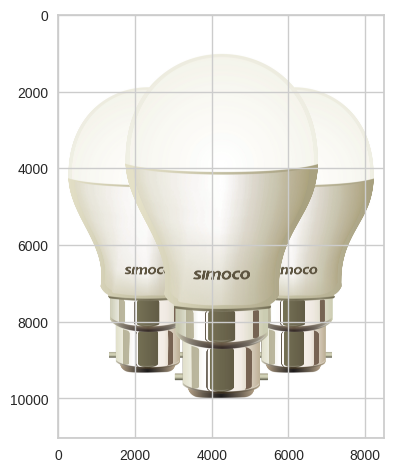

In [ ]:
# affichage de l'image la plus grande
print(data.category[677])
plt.imshow(cv2.imread(data.image_path[677]))

Baby Care


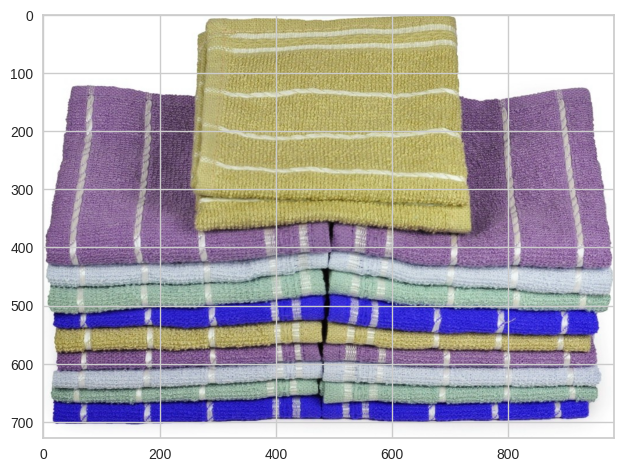

In [ ]:
# affichage de l'image de taille moyenne
print(data.category[2])
plt.imshow(cv2.imread(data.image_path[2]))

In [ ]:
image = cv2.imread(data.image_path[2])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) #COLOR_BGR2GRAY  COLOR_RGB2BGR

In [ ]:
kp = orb.detect(gray,None)
len(kp)

500

0.89 s.
7702 keypoints


array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)
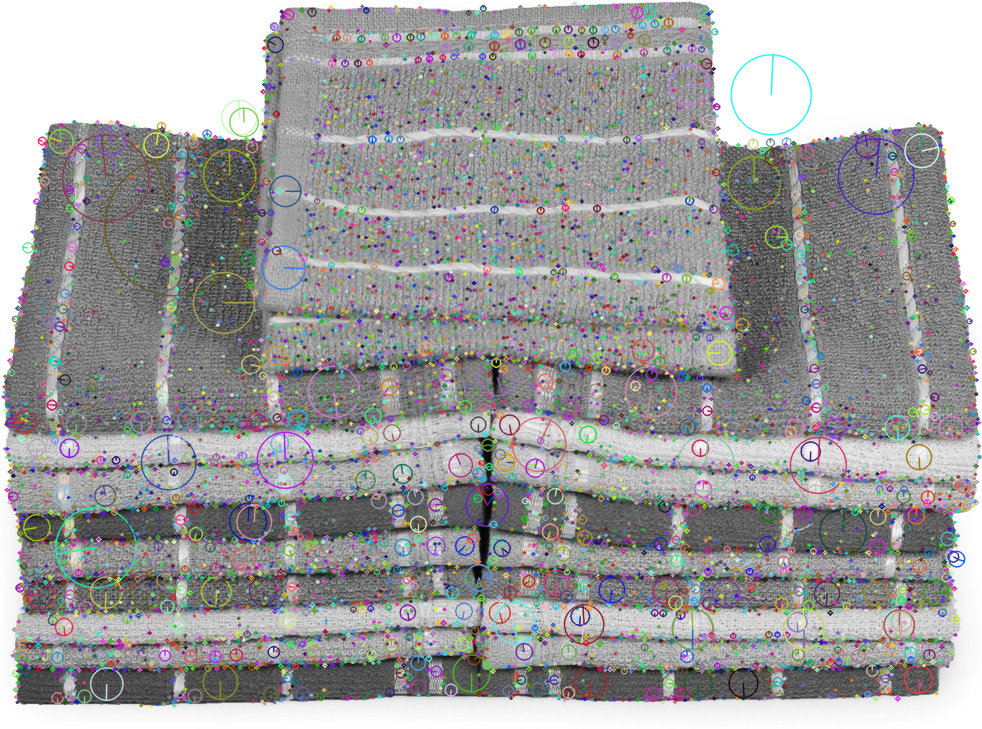

In [ ]:
# calcul des caractéristiques d'image avec sift
time1 = time()
kp_sift, desc_sift = sift.detectAndCompute(gray, None)
time2 = time() - time1
print(f'{round(time2, 2)} s.')
print(f'{len(kp_sift)} keypoints')
cv2.drawKeypoints(gray,kp_sift,image,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

0.03 s.
500 keypoints


array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)
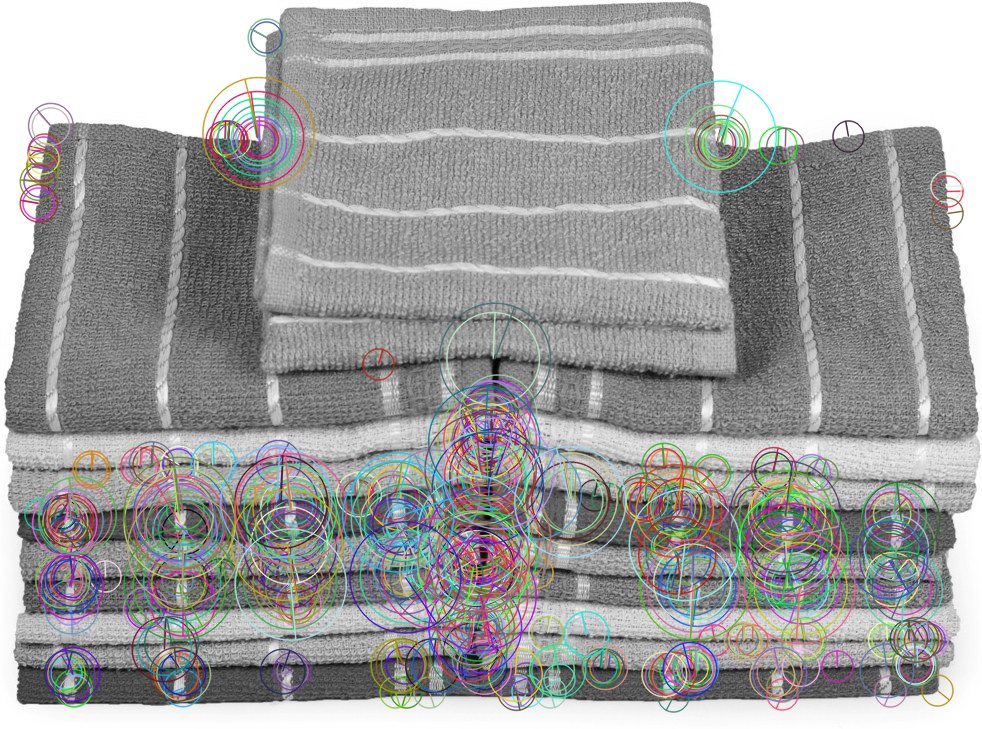

In [ ]:
# calcul des caractéristiques d'image avec orb
time1 = time()
kp_orb, desc_orb = orb.detectAndCompute(gray, None)
time2 = time() - time1
print(f'{round(time2, 2)} s.')
print(f'{len(kp_orb)} keypoints')
cv2.drawKeypoints(gray,kp_orb,image,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)
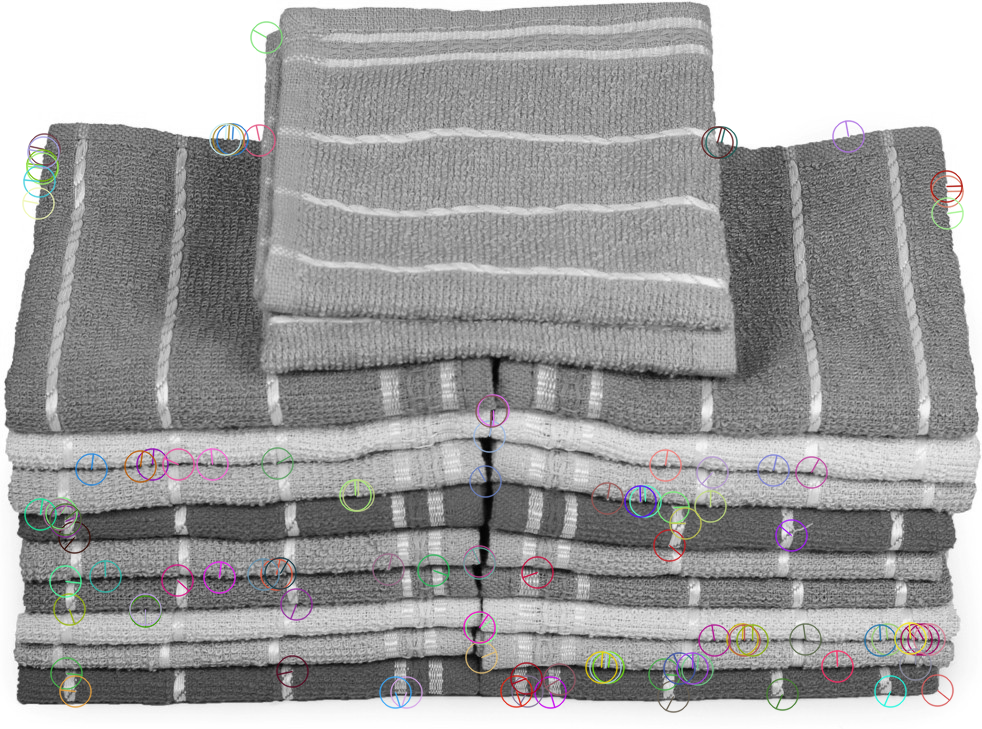

In [ ]:
cv2.drawKeypoints(gray,kp_orb[:100],image,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

In [ ]:
response = []
for k in range(len(kp_orb)):
  response.append(kp_orb[k].response)

max(response)

0.0035781990736722946

In [ ]:
response = []
for k in range(len(kp_sift)):
  response.append(kp_sift[k].response)

max(response)

0.090497225522995

In [ ]:
desc_orb.shape

In [ ]:
# Créer un tableau 2D
tableau = np.array([1, 2, 3, 4])

# Rembourrer le tableau avec une largeur de rembourrage de 1 pour chaque dimension
tableau_rembourre = np.pad(tableau, ((0, 10 - tableau.shape[0])), mode='constant')

print("Tableau original :\n", tableau)
print("\nTableau rembourré :\n", tableau_rembourre)

Tableau original :
 [1 2 3 4]

Tableau rembourré :
 [1 2 3 4 0 0 0 0 0 0]


In [ ]:
# test d'extraction de toutes les features avec ORB

dt = []
time0 = time()

for i in tqdm(range(data.shape[0])): #data.shape[0]

  with Image.open(data.image_path[i]) as img:
    # Convertir l'image en matrice numpy
    image = np.array(img)

  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  # calcul des caractéristiques d'image avec orb
  time1 = time()
  kp_orb, desc_orb = orb.detectAndCompute(gray, None)
  time2 = time() - time1
  dt.append(round(time2, 2))

  if desc_orb is not None:
    desc = desc_orb.flatten()
    if desc.shape[0] < 16000:
      desc = np.pad(desc, (0, 16000 - desc.shape[0]), mode='constant', constant_values=0)
    elif desc.shape[0] > 16000:
      desc = desc[:16000]
    desc = desc.reshape(1, desc.shape[0])
  else:
    desc = np.zeros((1, 16000))

  if i == 0:
    orb_feature = desc_orb.flatten()
    orb_feature = orb_feature.reshape(1, orb_feature.shape[0])
  else:
    orb_feature = np.concatenate((orb_feature, desc), axis = 0)

print(f'Terminé en {round( time() - time0 ) } s.')

 64%|██████▍   | 677/1050 [04:23<04:27,  1.39it/s]/usr/local/lib/python3.10/dist-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
100%|██████████| 1050/1050 [08:38<00:00,  2.03it/s]

Terminé en 518 s.


In [ ]:
orb_feature.shape

(1050, 16000)

In [ ]:
max(dt)

1.0

In [ ]:
# Réduire les dimensions avec PCA
print(f'dimensions avant pca : {orb_feature.shape}')

pca = PCA(n_components=0.99)
orb_feature_pca = pca.fit_transform(orb_feature)

print(f'dimensions après pca : {orb_feature_pca.shape}')

dimensions avant pca : (1050, 16000)
dimensions après pca : (1050, 997)


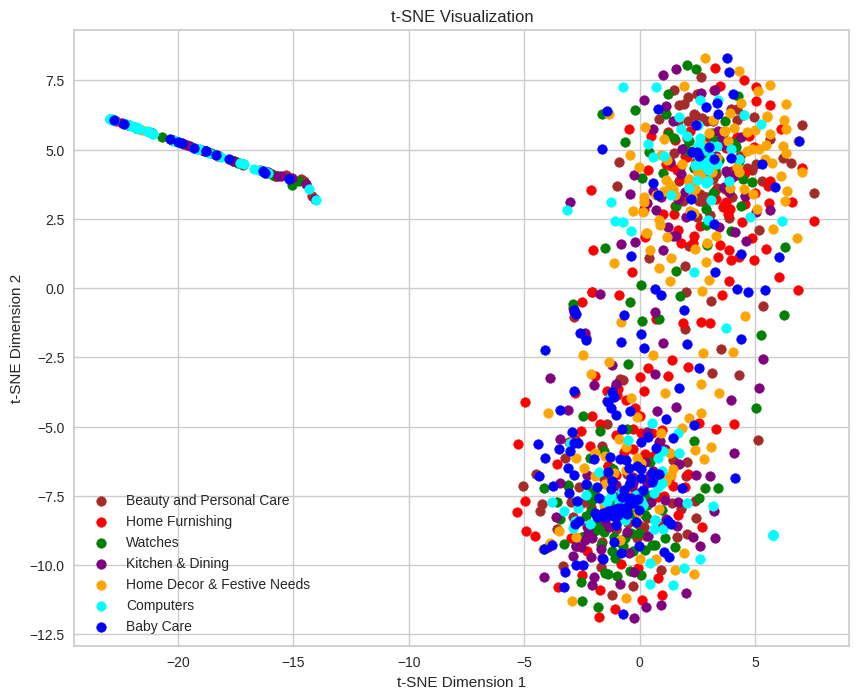

(array([[[1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         ...,
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.]],
 
        [[1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         ...,
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.]],
 
        [[1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         ...,
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.]],
 
        ...,
 
        [[1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         ...,
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.]],
 
        [[1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         ...,
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.]],
 
        [[1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         

In [ ]:
# affichage 2D
create_tsne_plot(orb_feature_pca)

0.02 s.
500 keypoints


array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)
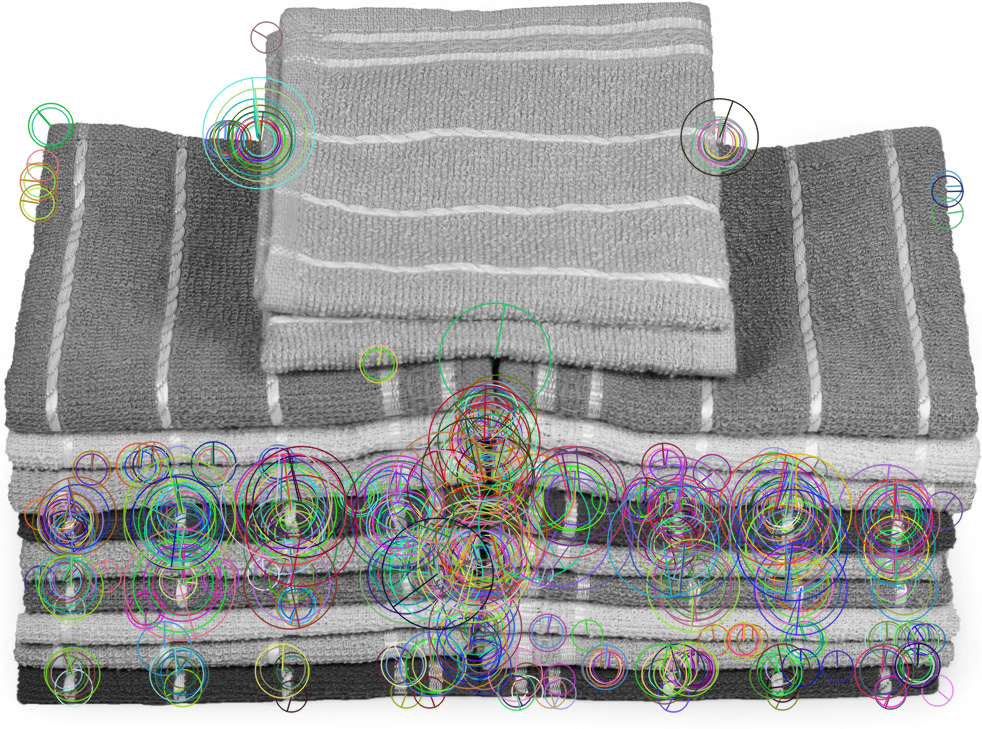

In [ ]:
with Image.open(data.image_path[2]) as img:
    # Convertir l'image en matrice numpy
    image = np.array(img)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# calcul des caractéristiques d'image avec orb
time1 = time()
kp_orb, desc_orb = orb.detectAndCompute(gray, None)
time2 = time() - time1
print(f'{round(time2, 2)} s.')
print(f'{len(kp_orb)} keypoints')
cv2.drawKeypoints(gray,kp_orb,image,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

In [ ]:
def extract_features(image, method):
    """
    image : from cv2.imread
    method : see sift or orb (surf not available)
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    keypoints, descriptors = method.detectAndCompute(gray, None)
    return descriptors.flatten() if descriptors is not None else np.array([])

In [ ]:
len(keypoints)

500

In [ ]:
i = 0
print(keypoints[i].pt)
print(keypoints[i].size)
print(keypoints[i].angle)
print(keypoints[i].response)

(712.0, 743.0)
31.0
243.2574920654297
7.836745498934761e-05


In [ ]:
descriptors.flatten().shape

(16000,)

In [ ]:
descriptors.flatten().shape

(3256960,)

In [ ]:
descriptors.flatten().shape

(11909120,)

In [ ]:
# read images
X = [cv2.imread(data['image_path'][i]) for i in tqdm(range(data.shape[0]))]
y = [data['category'][i] for i in range(data.shape[0])]

100%|██████████| 1050/1050 [00:46<00:00, 22.35it/s]


Courte vérification des temps de calculs et des tailles :

In [ ]:
im = X[0]

start_t = time()
extract_features(im, sift)
print(f'execution en {round(time() - start_t)} sec.')

execution en 15 sec.


In [ ]:
start_t = time()
extract_features(im, orb)
print(f'execution en {round(time() - start_t)} sec.')

execution en 0 sec.


In [ ]:
S1, S2, S, ratiovh = [], [], [], []
for i in range(len(X)):
  S1.append(X[i].shape[0])
  S2.append(X[i].shape[1])
  S.append(X[i].shape[0:2])
  ratiovh.append(X[i].shape[0]/X[i].shape[1])

np.min(S1), np.min(S2), np.max(S1), np.max(S2)

(160, 145, 11042, 8484)

Redimentionnement des images à 500 en conservant les rapports de taille :

In [ ]:
# resize to 500 px pictures being bigger than 500
ratiovh = []
X_resized = []
for i in tqdm(range(len(X))):

  v = X[i].shape[0]
  h = X[i].shape[1]
  ratiovh = v/h

  if (v > 500) or (h > 500):
    target_size = (500, int(500 * ratiovh))
    X_resized.append(cv2.resize(X[i], target_size))
  else:
    X_resized.append(X[i])

100%|██████████| 1050/1050 [00:02<00:00, 393.90it/s]


In [ ]:
# Extract features from all images by two methods
X_features_sift = [extract_features(img, sift) for img in tqdm(X_resized)]
X_features_orb = [extract_features(img, orb) for img in tqdm(X_resized)]

100%|██████████| 1050/1050 [00:10<00:00, 97.45it/s] 


In [ ]:
# finally I put all image to same size for KMEANS and also CNN
X_resized_square = []
for i in tqdm(range(len(X))):

  target_size = (224, 224)
  X_resized_square.append(cv2.resize(X[i], target_size))

# Extract features from all images by two methods
X_square_sift = [extract_features(img, sift) for img in tqdm(X_resized_square)]
X_square_orb = [extract_features(img, orb) for img in tqdm(X_resized_square)]

100%|██████████| 1050/1050 [00:03<00:00, 298.80it/s]


In [ ]:
# 2. Padding (Make all feature vectors have the same length)
max_len = max(len(features) for features in X_square_sift)
X_sift_padded = [np.pad(features, (0, max_len - len(features))) for features in X_square_sift]
X_sift_padded = np.asarray(X_sift_padded)

In [ ]:
scaler = StandardScaler()
X_square_sift_scaled = scaler.fit_transform(X_sift_padded)

### Brouillon

In [ ]:
# Load images and labels
# Assume you have loaded images and corresponding labels into X and y arrays
X = [cv2.imread(data['image_path'][i]) for i in tqdm(range(data.shape[0]))]
y = [data['category'][i] for i in range(data.shape[0])]


# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_features, y, test_size=0.2, random_state=42)

# Create a classifier pipeline
clf_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svm', SVC(kernel='rbf', C=1.0, gamma='scale'))
])

# Train the classifier
clf_pipeline.fit(X_train, y_train)

# Predict on the test set
y_pred = clf_pipeline.predict(X_test)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


In [ ]:
cv2.imread(data['image_path'][0]).shape

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

path_image = path_data+'Images/'

# Load image
image = cv2.imread(path_image+'fffa2117a4006d4a848eb7d5b80d4816.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect keypoints and compute descriptors
keypoints, descriptors = sift.detectAndCompute(gray, None)

# Draw keypoints on the image
image_with_keypoints = cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display the result
cv2_imshow(image_with_keypoints)
cv2.waitKey(0)
cv2.destroyAllWindows()


## CNN

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import Model

# Step 1: Load Pre-Trained VGG16 Model (excluding top classification layers)
base_model = VGG16(weights='imagenet', include_top=False)

# Step 2: Remove Top Layers (Classification layers)
model = Model(inputs=base_model.input, outputs=base_model.layers[-1].output)

# Step 3: Extract Features from Images
def extract_features_CNN(images_paths, model):
    features = []
    for img_path in tqdm(images_paths):
        # Load image and preprocess
        img = image.load_img(img_path, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        img = preprocess_input(img)

        # Extract features using the CNN model
        img_features = model.predict(img)
        features.append(img_features.flatten())
    return np.array(features)

CNN_features = np.asarray(extract_features_CNN(data['image_path'], model))

# Extracted features will be a numpy array where each row corresponds to the extracted features of an image
print("Shape of extracted features:", extract_features_CNN.shape)


In [ ]:
CNN_features

array([[ 0.      ,  0.      ,  0.      , ...,  0.      ,  0.      ,
         0.      ],
       [ 0.      ,  0.      ,  0.      , ...,  0.      ,  0.      ,
         0.      ],
       [ 0.      ,  0.      ,  0.      , ...,  0.      ,  0.      ,
         0.      ],
       ...,
       [ 1.722801, 50.202034,  0.      , ...,  0.      ,  8.732806,
         0.      ],
       [ 0.      ,  0.      ,  0.      , ...,  0.      ,  0.      ,
         0.      ],
       [ 0.      ,  0.      ,  0.      , ...,  0.      ,  0.      ,
         0.      ]], dtype=float32)

In [ ]:
# Extracted features will be a numpy array where each row corresponds to the extracted features of an image
print("Shape of extracted features:", CNN_features.shape)

Shape of extracted features: (1050, 25088)
